# Regression Project

## 0. Credits

* Big Thanks to Khalil Dayri for providing the dataset used in this project.
* For clarity sake, the javascript used to make some of the Bokeh charts more interactive have been minified with www.jscompress.com but can be unminified with www.unminify.com for code review purpose.

## 1. Problem statement

Our **Global Execution Services (GES)** offer Algorithmic Execution services to a large variety of clients.

In this space, one of the key differentiator between Algo Trading providers is how efficiently one can execute strategies a client has signed up to. 

Popular algo strategies are Percentage of Volume, Pegged, VWAP, TWAP, Implementation shortfall, Target close etc.

In Equity markets, two factors that will play a significant part in being able to execute such strategies with success is `Daily Volume` (total volume exchanged in a day) and `Close Volume` (volume exchanged during the Auction Process of an exchange at the end of each day).

Indeed, sufficient liquidity is obviously critical in the actual execution of any strategy (no volume, no trades, no clients!) and being able to predict volume is of great importance to an algo decision making process.

**In this project we will try to answer the following question**:
 1. `Can we predict future close volumes from historical volumes and other factors?`

## 2. Overview

**To answer this question** we will try several regression models and identify the ones best suited for the task.

Our data will be daily volumes of FTSE100 consituents between 2010-01-04 and 2019-02-26.

**Features**

In addition to **Volume derived features** we will also introduce the notion of **`Special Days`**.

A **Special Day** will differ from a **Regular Day** in that it is the effective date of one of the following industry events:
1. `Monthly Last Business Day`: Simply the last day of the trading month.
2. `MSCI Europe Quarterly Review`: The effective day for the latest MSCI Europe quarterly index review.
3. `MSCI Europe Semi-Annual Review`: The effective day for the latest MSCI Europe semi-annual index review.
4. `Quarterly Expiry`: The quarterly option expiry day.

**Influence of Special Days**

Intuitively these **Special Days** are likely to influence volumes on the following basis:
* `Monthly Last Business Day`: Many market participants have month-end operational processes which could potentially lead to increased
market activity.
* `MSCI Europe Quarterly Review` and `MSCI Europe Semi-Annual Review`: MSCI is one of the most influancial Equity Index provider. Their indexes are reviewed quarterly and semi-annually. Whenever a review leads to a change to an index, on the effective date of that change, a significant amount of market activity will be induced by market participants who are dependent on those indexes. (ETF, Funds,...).
* `Quarterly Expiry`: When an option expires and gets exercised the underlying equity will have to be delivered and extra market activity could be expected during the expiry cycle.

**Data source**

The data for this project has been kindly provided by Khalil Dayri from our GES team.

We will therefore not describe how it was put together but for reference:
* Prices/volumes where sourced from **Bloomberg**
* MSCI Europe index review dates can be found here https://www.msci.com/quarterly-index-review



## 3. Importing libraries

In [34]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from bokeh.palettes import Spectral4
from bokeh.plotting import figure, output_file, show
from bokeh.models import CrosshairTool, HoverTool, ZoomInTool, ZoomOutTool, PanTool, BoxZoomTool, NumeralTickFormatter, CustomJS, DataRange1d
from bokeh.models.sources import ColumnDataSource
from bokeh.io import output_notebook
from bokeh.palettes import Category20
import itertools

#import sklearn auxillary packages
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

#import sklearn regression models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, Lars, OrthogonalMatchingPursuit, BayesianRidge, ARDRegression, SGDRegressor, PassiveAggressiveRegressor, RANSACRegressor, TheilSenRegressor, HuberRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, NuSVR, LinearSVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.isotonic import IsotonicRegression

import lightgbm as lgb

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import lag_plot

from itertools import product
from scipy import stats
import time

output_notebook()
%matplotlib inline

Loading BokehJS ...

## 4. Data exploration

In [35]:
# let's load our dataset
df = pd.read_csv('./datasets/UKX_Volume_Close.csv')
df.shape

(348123, 12)

In [36]:
# let's have a peak at the data
df.head()

,Ticker,Date,CLOSE_VOLUME,DailyVolume,specialDay,close_pct,VWAP_VOLUME_uts_mean_20d,VWAP_VOLUME_uts_median_20d,close_pct_uts_mean_20d,close_pct_uts_median_20d,DateType,weekday
0,AAL LN Equity,2010-01-04,424630,4247494.0,False,9.997189,NaN,NaN,NaN,NaN,regular,NaN
1,AAL LN Equity,2010-01-05,528935,3296014.0,False,16.047717,4247494.00,4247494.0,9.997189,9.997189,regular,NaN
2,AAL LN Equity,2010-01-06,504512,4857226.0,False,10.386834,3771754.00,3771754.0,13.022453,13.022453,regular,NaN
3,AAL LN Equity,2010-01-07,490633,4285531.0,False,11.448593,4133578.00,4247494.0,12.143913,10.386834,regular,NaN
4,AAL LN Equity,2010-01-08,582032,3439338.0,False,16.922792,4171566.25,4266512.5,11.970083,10.917713,regular,NaN


In [37]:
# let's check the data types
df.dtypes

Ticker                         object
Date                           object
CLOSE_VOLUME                    int64
DailyVolume                   float64
specialDay                       bool
close_pct                     float64
VWAP_VOLUME_uts_mean_20d      float64
VWAP_VOLUME_uts_median_20d    float64
close_pct_uts_mean_20d        float64
close_pct_uts_median_20d      float64
DateType                       object
weekday                        object
dtype: object

In [38]:
# let's rename the column names to be more consistent in our naming convention
old_names = ['Ticker', 'Date', 'CLOSE_VOLUME', 'DailyVolume', 'specialDay',
       'close_pct', 'VWAP_VOLUME_uts_mean_20d', 'VWAP_VOLUME_uts_median_20d',
       'close_pct_uts_mean_20d', 'close_pct_uts_median_20d', 'DateType',
       'weekday']
new_names = ['ticker', 'date', 'close_volume', 'daily_volume', 'special_day',
       'close_pct', 'daily_volume_mean_20d', 'daily_volume_median_20d',
       'close_pct_mean_20d', 'close_pct_median_20d', 'date_type',
       'weekday']
df.rename(columns=dict(zip(old_names, new_names)), inplace=True)
df.head()

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,daily_volume_median_20d,close_pct_mean_20d,close_pct_median_20d,date_type,weekday
0,AAL LN Equity,2010-01-04,424630,4247494.0,False,9.997189,NaN,NaN,NaN,NaN,regular,NaN
1,AAL LN Equity,2010-01-05,528935,3296014.0,False,16.047717,4247494.00,4247494.0,9.997189,9.997189,regular,NaN
2,AAL LN Equity,2010-01-06,504512,4857226.0,False,10.386834,3771754.00,3771754.0,13.022453,13.022453,regular,NaN
3,AAL LN Equity,2010-01-07,490633,4285531.0,False,11.448593,4133578.00,4247494.0,12.143913,10.386834,regular,NaN
4,AAL LN Equity,2010-01-08,582032,3439338.0,False,16.922792,4171566.25,4266512.5,11.970083,10.917713,regular,NaN


### 4.1 Data columns definition

`ticker` identifies uniquely each stock constituents of the FTSE100 index.

`date` is the business date for which the sample relates to.

`close_volume` is the total volume traded during the Auction Closing process.

`daily_volume` is the total volume traded in one day.

`special_day` is a bool denoting whether that date is a Special Day or not.

`close_pct` is the ratio `close_volume`/`daily_volume` expressed in percentage terms.

`daily_volume_mean_20d` is the 20-period moving average of `daily_volume`.

`daily_volume_median_20d` is the 20-period moving median of `daily_volume`.

`close_pct_mean_20d` is the 20-period moving average of `close_volume`.

`close_pct_median_20d` is the 20-period moving median of `close_volume`.

`date_type` qualifies the type of date the sample date is out of the following values ['regular', 'Monthly Last Business day',
       'MSCIEurope Quarterly Review', 'Quarterly Expiry',
       'MSCIEurope Semi-Annual Review'].
       
`weekday` is the day of the week for this sample `date`.

### 4.2 Data profiling using pandas_profiling

In [20]:
profile = pandas_profiling.ProfileReport(df)
profile.to_file(outputfile="output.html")
display(profile)

Number of variables,12
Number of observations,348123
Total Missing (%),7.7%
Total size in memory,29.5 MiB
Average record size in memory,89.0 B
Numeric,5
Categorical,4
Boolean,1
Date,0
Text (Unique),0
Rejected,2


#### Data profiling conclusions

* `date` is currently of type string/categorical.
<br>We will **convert it to datetime**.


* `weekday` is only populated for **Special Days**.
<br>We will **populate it for regular days also** as the day of the week might be an interesting feature to explain trading volumes.


* `close_volume` and `daily_volume` are highly skewed.
<br>We will **apply log transform** and see if it helps our model.


* `daily_volume_mean_20d`, `daily_volume_median_20d`, `close_pct_mean_20d` and `close_pct_median_20d` have null values.
<br>We will **take a closer look** at those NaNs in our data cleaning section and decide whether to discard them or to estimate a value for them.


* `daily_volume_mean_20d` and `daily_volume_median_20d` are highly correlated.
<br>We will only use `daily_volume_mean_20d` in our model and **drop** `daily_volume_median_20d`.


* `close_pct_mean_20d` and `close_pct_median_20d` are highly correlated.
<br>We will only use `close_pct_mean_20d` in our model and **drop** `close_pct_median_20d`.


* `Ticker` (which describe a single stock) takes 164 value.
<br>**No problem here** but just a comment. One might find this odd for the FTSE100 to have more than 100 constituents. This is due to the historical rebalancing of its constituents as some stocks are added/removed and also, despite its name, currently the FTSE100 has 101 constituents anyway!
<br>That being said, each ticker has been suffixed with 'LN Equity' which we don't really need so we'll **scrap that part an only keep the actual ticker**.


### 4.3 Data cleaning and enrichments

#### 4.3.1 Converting to new data types

In [39]:
# let's convert `date` to datetime
before = str(df.dtypes['date'])
df['date'] = pd.to_datetime(df['date'])
after = str(df.dtypes['date'])
print('Date type before: {}, after: {}'.format(before, after))

Date type before: object, after: datetime64[ns]


In [40]:
# let's convert 'special_day' to int as some issues were encountered in certain seaborn plots when using bool values!
before = str(df.dtypes['special_day'])
df['special_day'] = df['special_day'].astype(int)
after = str(df.dtypes['special_day'])
print('Special_day type before: {}, after: {}'.format(before, after))

Special_day type before: bool, after: int32


#### 4.3.2 Missing week days

In [41]:
# let's remove missing weekdays by repopulating the whole column
before = df[df.columns].isnull().any(axis=0)['weekday']
df['weekday'] = df['date'].dt.day_name()
after = df[df.columns].isnull().any(axis=0)['weekday']
print('Any missing values for weekday before: {}, after: {}'.format(before, after))

Any missing values for weekday before: True, after: False


#### 4.3.3 Other missing values

In [42]:
# let's print column names with null values
print('Columns with null values: {}'.format(list(df.columns[np.where(df[df.columns].isnull().any(axis=0))])))
impact_sample_count = df[df[df.columns[:-1]].isnull().any(axis=1)].shape[0]
print('There are {} samples impacted ({:.2f}% of all samples)'.format(impact_sample_count, 100*impact_sample_count/df.shape[0]))

Columns with null values: ['daily_volume_mean_20d', 'daily_volume_median_20d', 'close_pct_mean_20d', 'close_pct_median_20d']
There are 169 samples impacted (0.05% of all samples)


In [43]:
# Let's look at some of the samples impacted by those null value
df[df[df.columns[:-1]].isnull().any(axis=1)].head()

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,daily_volume_median_20d,close_pct_mean_20d,close_pct_median_20d,date_type,weekday
0,AAL LN Equity,2010-01-04,424630,4247494.0,0,9.997189,NaN,NaN,NaN,NaN,regular,Monday
2346,ABF LN Equity,2010-01-04,156165,2916538.0,0,5.354465,NaN,NaN,NaN,NaN,regular,Monday
4692,ACA LN Equity,2010-03-19,415486,26439302.0,1,1.571471,NaN,NaN,NaN,NaN,Quarterly Expiry,Friday
4693,ACA LN Equity,2010-03-23,169389,1651872.0,0,10.254366,NaN,NaN,NaN,NaN,regular,Tuesday
6982,ADM LN Equity,2010-01-04,72950,660210.0,0,11.049515,NaN,NaN,NaN,NaN,regular,Monday


Clearly these null values are due to the rolling mean/median columns requiring previous data to yield a value.

We will **discard them as the number of impacted samples is negligable (0.05%)**.


In [44]:
# dropping samples with null values
before =df.shape[0]
df = df.dropna()
after = df.shape[0]
print('df sample count before: {}, after: {}'.format(before, after))

df sample count before: 348123, after: 347954


#### 4.3.4 Dropping correlated variables

In [45]:
# let's drop daily_volume_median_20d and close_pct_median_20d
df.drop(columns=['daily_volume_median_20d', 'close_pct_median_20d'], inplace=True)
df.head()

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,close_pct_mean_20d,date_type,weekday
1,AAL LN Equity,2010-01-05,528935,3296014.0,0,16.047717,4247494.00,9.997189,regular,Tuesday
2,AAL LN Equity,2010-01-06,504512,4857226.0,0,10.386834,3771754.00,13.022453,regular,Wednesday
3,AAL LN Equity,2010-01-07,490633,4285531.0,0,11.448593,4133578.00,12.143913,regular,Thursday
4,AAL LN Equity,2010-01-08,582032,3439338.0,0,16.922792,4171566.25,11.970083,regular,Friday
5,AAL LN Equity,2010-01-11,547670,4376252.0,0,12.514590,4025120.60,12.960625,regular,Monday


#### 4.3.5 Ticker formatting

In [46]:
# get list of unique tickers
tickers = df.ticker.unique()
# create list of new tickers keeping only the first word (the actual ticker)
new_tickers = np.array([x.split(' ')[0] for x in tickers])
# replace each ticker with its new value using the map function which takes as a parameter a dict of key:value defined as 'old_value': 'new_value'
df.ticker = df.ticker.map(dict(zip(tickers, new_tickers)))
print(df.ticker.unique())

['AAL' 'ABF' 'ACA' 'ADM' 'ADN' 'AGK' 'AHT' 'AMFW' 'ANTO' 'ARM' 'ASHM'
 'ATST' 'AU/' 'AUTO' 'AV/' 'AZN' 'BA/' 'BAB' 'BARC' 'BATS' 'BDEV' 'BG/'
 'BHP' 'BKG' 'BLND' 'BNZL' 'BP/' 'BRBY' 'BT/A' 'CCH' 'CCL' 'CNA' 'CNE'
 'COB' 'CPG' 'CPI' 'CRDA' 'CRH' 'CTEC' 'CW/' 'CWC' 'DC/' 'DCC' 'DGE' 'DLG'
 'EMG' 'ENRC' 'ESSR' 'EVR' 'EXPN' 'EZJ' 'FERG' 'FLG' 'FRES' 'GFS' 'GKN'
 'GLEN' 'GSK' 'GVC' 'HIK' 'HL/' 'HLMA' 'HMSO' 'HOME' 'HSBA' 'HSX' 'IAG'
 'IAP' 'IHG' 'III' 'IMB' 'IMI' 'INF' 'INTU' 'INVP' 'IPR' 'ISAT' 'ISYS'
 'ITRK' 'ITV' 'JE/' 'JMAT' 'KAZ' 'KGF' 'LAND' 'LGEN' 'LLOY' 'LMI' 'LSE'
 'MCRO' 'MDC' 'MERL' 'MGGT' 'MKS' 'MNDI' 'MRO' 'MRW' 'NG/' 'NMC' 'NXT'
 'OCDO' 'OML' 'PFC' 'PFG' 'PNN' 'POLY' 'PPB' 'PRU' 'PSN' 'PSON' 'RB/'
 'RBS' 'RDSA' 'RDSB' 'REL' 'REX' 'RIO' 'RMG' 'RMV' 'RR/' 'RRS' 'RSA' 'RTO'
 'SAB' 'SBRY' 'SDR' 'SDRC' 'SGE' 'SGRO' 'SHP' 'SKG' 'SKY' 'SLA' 'SMDS'
 'SMIN' 'SMT' 'SN/' 'SPD' 'SPX' 'SRP' 'SSE' 'STAN' 'STJ' 'SVT' 'TATE'
 'TCG' 'TLW' 'TPK' 'TSCO' 'TT/' 'TUI' 'TUIJ' 'TW/' 'ULVR' 'UU/' 'VED

#### 4.3.6 Special days impact on time series continuity

In [47]:
# let's take a closer look at a specific ticker, say 'ABF' and let's make sure that we have one record per date

# we first group all ABF samples per date and count the number of samples in each group
abf = df.loc[df.ticker=='ABF'][['date', 'ticker']].groupby(['date']).count().rename(columns={'ticker': 'ct'})

# have we got any group with more than one sample?
abf.loc[abf.ct>1].shape

(33, 1)

Well that's unexpected, it seems in some instances (33 dates for ABF) **we have more than one sample for a given ticker and date**! 

In [48]:
# let's check for ABF which date are represented more than once
df.loc[df.ticker=='ABF'][df.date.isin(abf.loc[abf.ct>1].index)]

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,close_pct_mean_20d,date_type,weekday
2385,ABF,2010-02-26,452712,1444564.0,1,31.339006,1.987908e+06,13.989001,MSCIEurope Quarterly Review,Friday
2386,ABF,2010-02-26,452712,1444564.0,1,31.339006,1.987908e+06,13.989001,Monthly Last Business day,Friday
2513,ABF,2010-08-31,424222,1006383.0,1,42.153137,1.502940e+06,17.831233,MSCIEurope Quarterly Review,Tuesday
2514,ABF,2010-08-31,424222,1006383.0,1,42.153137,1.502940e+06,17.831233,Monthly Last Business day,Tuesday
2579,ABF,2010-11-30,308378,745074.0,1,41.388909,1.095657e+06,19.256644,MSCIEurope Semi-Annual Review,Tuesday
2580,ABF,2010-11-30,308378,745074.0,1,41.388909,1.095657e+06,19.256644,Monthly Last Business day,Tuesday
2641,ABF,2011-02-28,664779,4889827.0,1,13.595144,9.991977e+05,20.506185,MSCIEurope Quarterly Review,Monday
2642,ABF,2011-02-28,664779,4889827.0,1,13.595144,9.991977e+05,20.506185,Monthly Last Business day,Monday
2703,ABF,2011-05-31,643923,1788070.0,1,36.012181,1.421246e+06,21.862159,MSCIEurope Semi-Annual Review,Tuesday
2704,ABF,2011-05-31,643923,1788070.0,1,36.012181,1.421246e+06,21.862159,Monthly Last Business day,Tuesday


Ok so apparently **each Special Day type is represented with one individual sample**, meaning that if several Special Days occur on the same day we will have duplicated samples for that day.

Furthermore, as we don't have any regular days for these duplicated dates above, it means that **for dates where we have a Special Day we won't have a regular day**, meaning that we will have a broken time series if we only look at regular days, and we will get duplicates if we look at all samples.

**We need a better way to represent the Special Days information, one which doesn't involve messing with our time series continuity.**

What we propose here is to **rebuild a new dataframe** with `one sample per tuple (ticker, date)` and encode the date_type information as binary 0/1 flags for each of the values it currently takes.

Let's go through the details!

In [49]:
# first let's take all unique day samples from df whilst dropping column 'date_type' as it will be reengineered.
# to do this we take all unique tuples (ticker, date, close_volume, daily_volume, special_day, close_pct, daily_volume_mean_20d, close_pct_mean_20d, weekday)
# this will give us all unique (ticker, date) observations, most of which are regular days and some of which are special days but without duplicates if several special days occured on a same date.
df_new = df[list(df.columns[df.columns!='date_type'])].drop_duplicates().copy()
df_new.shape

(343055, 9)

In [50]:
df_new.head(2)

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,close_pct_mean_20d,weekday
1,AAL,2010-01-05,528935,3296014.0,0,16.047717,4247494.0,9.997189,Tuesday
2,AAL,2010-01-06,504512,4857226.0,0,10.386834,3771754.0,13.022453,Wednesday


In [51]:
# second let's create new columns to hold the 0/1 flag encoding of the original 'date_type' column. 
df_new['date_type_regular'] = 0
df_new['date_type_monthly_last_business_day'] = 0
df_new['date_type_msci_quarterly_review'] = 0
df_new['date_type_msci_semi_annual_review'] = 0
df_new['date_type_quarterly_expiry'] = 0

In [52]:
# defining a list with all date_types corresponding to a special day
date_types = ['Monthly Last Business day', 'MSCIEurope Quarterly Review', 'MSCIEurope Semi-Annual Review', 'Quarterly Expiry']
# defining a list of target column names for the 0/1 flag encoding of the special days date_types column
date_type_ohe_col_names = ['date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']

# looping through all tuple (date_type, date_type_ohe_col_name) to compute the binary flag encoding of each special day date_types
for date_type, date_type_ohe_col_name in zip(date_types, date_type_ohe_col_names):
    df_new = pd.merge(df_new, df.loc[(df.date_type==date_type)][['ticker', 'date', 'date_type']], left_on=['ticker', 'date'], right_on=['ticker', 'date'], how='left')
    df_new.loc[df_new.date_type==date_type, date_type_ohe_col_name] = 1
    df_new.drop(columns=['date_type'], inplace=True)

# now knowing all special days we can compute the binary flag encoding column for regular days (date_type_regular) like so:
df_new.loc[(df_new.date_type_monthly_last_business_day==0) &
           (df_new.date_type_msci_quarterly_review==0) &
           (df_new.date_type_msci_semi_annual_review==0) &
           (df_new.date_type_quarterly_expiry==0), 'date_type_regular'] = 1
df_new.head()

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,close_pct_mean_20d,weekday,date_type_regular,date_type_monthly_last_business_day,date_type_msci_quarterly_review,date_type_msci_semi_annual_review,date_type_quarterly_expiry
0,AAL,2010-01-05,528935,3296014.0,0,16.047717,4247494.00,9.997189,Tuesday,1,0,0,0,0
1,AAL,2010-01-06,504512,4857226.0,0,10.386834,3771754.00,13.022453,Wednesday,1,0,0,0,0
2,AAL,2010-01-07,490633,4285531.0,0,11.448593,4133578.00,12.143913,Thursday,1,0,0,0,0
3,AAL,2010-01-08,582032,3439338.0,0,16.922792,4171566.25,11.970083,Friday,1,0,0,0,0
4,AAL,2010-01-11,547670,4376252.0,0,12.514590,4025120.60,12.960625,Monday,1,0,0,0,0


##### Consistency checks following the encoding of date_type as binary flags

Now that we've re-encoded the original `date_type` column into the following binary flags: `date_type_regular`, `date_type_monthly_last_business_day`, `date_type_msci_quarterly_review`, `date_type_msci_semi_annual_review`, `date_type_quarterly_expiry`, let's make sure we haven't lost any information and kept the original data consistency.

In [53]:
# firstly, let's check that the overall number of samples is still the same
original_sample_count = df[df.special_day==0].shape[0] + df[df.special_day==1][['date', 'ticker']].drop_duplicates().shape[0]
new_sample_count = df_new.shape[0]
print('SAMPLE COUNT CHECK,  original: {}, new: {}, result: {}'.format(original_sample_count, new_sample_count, 'PASSED' if original_sample_count==new_sample_count else 'FAILED'))

SAMPLE COUNT CHECK,  original: 343055, new: 343055, result: PASSED


In [54]:
# secondly, let's check that for each ticker we have the same special days, we'll do this by isolating for each special day type, all tuples (ticker, date) into 2 dataframes: one for original dataset (df)
# and one for the new dataset (df_new), then we'll compare the two dataframes using the pandas function 'equals'. 
for date_type, date_type_ohe_col_name in zip(date_types, date_type_ohe_col_names):
    original_date_type_df = df[df.date_type==date_type][['ticker', 'date']].reset_index(drop=True)
    new_date_type_df = df_new[df_new[date_type_ohe_col_name]==1][['ticker', 'date']].reset_index(drop=True)
    result = original_date_type_df.equals(new_date_type_df)
    print('DATE TYPE DATA CHECK, for {}, result: {}'.format(date_type, 'PASSED' if result else 'FAILED'))

DATE TYPE DATA CHECK, for Monthly Last Business day, result: PASSED
DATE TYPE DATA CHECK, for MSCIEurope Quarterly Review, result: PASSED
DATE TYPE DATA CHECK, for MSCIEurope Semi-Annual Review, result: PASSED
DATE TYPE DATA CHECK, for Quarterly Expiry, result: PASSED


In [55]:
# lastly, let's check that the special_day counts for (date, ticker) tuples are consistent between original and new datasets and that they match the information encoded in the special days 0/1 flag columns
original_special_day_count = df.loc[df.special_day==1][['date', 'ticker']].drop_duplicates().shape[0]
new_special_day_count = df_new.loc[df_new.special_day==1].shape[0]
new_special_day_count_encoded = df_new.loc[(df_new.date_type_monthly_last_business_day==1) |
                                           (df_new.date_type_msci_quarterly_review==1) |
                                           (df_new.date_type_msci_semi_annual_review==1) |
                                           (df_new.date_type_quarterly_expiry==1)].shape[0]
result = (original_special_day_count == new_special_day_count == new_special_day_count_encoded)
print('SPECIAL DAY COUNT CHECK, original: {}, new: {}, encoded: {}, result: {}'.format(original_special_day_count, new_special_day_count, new_special_day_count_encoded, 'PASSED' if result else 'FAILED'))

SPECIAL DAY COUNT CHECK, original: 22127, new: 22127, encoded: 22127, result: PASSED


**The new encoding for the date type feature seems to be a success!**

In [56]:
# last consideration in our data cleaning section: special_day and date_type_regular are simply the opposite of one another so no need to keep them both, let's drop date_type_regular
df_new.drop(columns=['date_type_regular'], inplace=True)
# finally, now that new dataframe is finalized let's replace df with it so we can use df in this notebook going forward instead of df_new.
df = df_new
df.head()

,ticker,date,close_volume,daily_volume,special_day,close_pct,daily_volume_mean_20d,close_pct_mean_20d,weekday,date_type_monthly_last_business_day,date_type_msci_quarterly_review,date_type_msci_semi_annual_review,date_type_quarterly_expiry
0,AAL,2010-01-05,528935,3296014.0,0,16.047717,4247494.00,9.997189,Tuesday,0,0,0,0
1,AAL,2010-01-06,504512,4857226.0,0,10.386834,3771754.00,13.022453,Wednesday,0,0,0,0
2,AAL,2010-01-07,490633,4285531.0,0,11.448593,4133578.00,12.143913,Thursday,0,0,0,0
3,AAL,2010-01-08,582032,3439338.0,0,16.922792,4171566.25,11.970083,Friday,0,0,0,0
4,AAL,2010-01-11,547670,4376252.0,0,12.514590,4025120.60,12.960625,Monday,0,0,0,0


#### 4.3.5 Additional features

In [57]:
# let's add a 20-day moving average for close_volume
df['close_volume_mean_20d'] = 0
tickers = df.ticker.unique()
for ticker in tickers:
    df.loc[df.ticker==ticker, 'close_volume_mean_20d'] = df.loc[df.ticker==ticker].close_volume.rolling(20).mean()

In [58]:
# reordering columns and removing NaNs
df = df[['ticker', 'date', 'weekday', 'special_day', 'daily_volume', 'close_volume', 
       'close_pct', 'daily_volume_mean_20d', 'close_volume_mean_20d', 'close_pct_mean_20d', 
       'date_type_monthly_last_business_day',
       'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review',
       'date_type_quarterly_expiry']].dropna()

In [59]:
df.head()

,ticker,date,weekday,special_day,daily_volume,close_volume,close_pct,daily_volume_mean_20d,close_volume_mean_20d,close_pct_mean_20d,date_type_monthly_last_business_day,date_type_msci_quarterly_review,date_type_msci_semi_annual_review,date_type_quarterly_expiry
19,AAL,2010-02-01,Monday,0,7777020.0,505199,6.496049,5895972.158,605613.15,10.517995,0,0,0,0
20,AAL,2010-02-02,Tuesday,0,7855356.0,758323,9.653579,5990024.550,617082.55,10.316897,0,0,0,0
21,AAL,2010-02-03,Wednesday,0,5816906.0,628579,10.806071,6078849.857,623285.90,10.285311,0,0,0,0
22,AAL,2010-02-04,Thursday,0,8524647.0,816928,9.583130,6153583.762,639600.65,10.323829,0,0,0,0
23,AAL,2010-02-05,Friday,0,9281890.0,1310037,14.113904,6402566.286,676000.90,10.015992,0,0,0,0


## 5. Data visualisation

### 5.1 Correlation

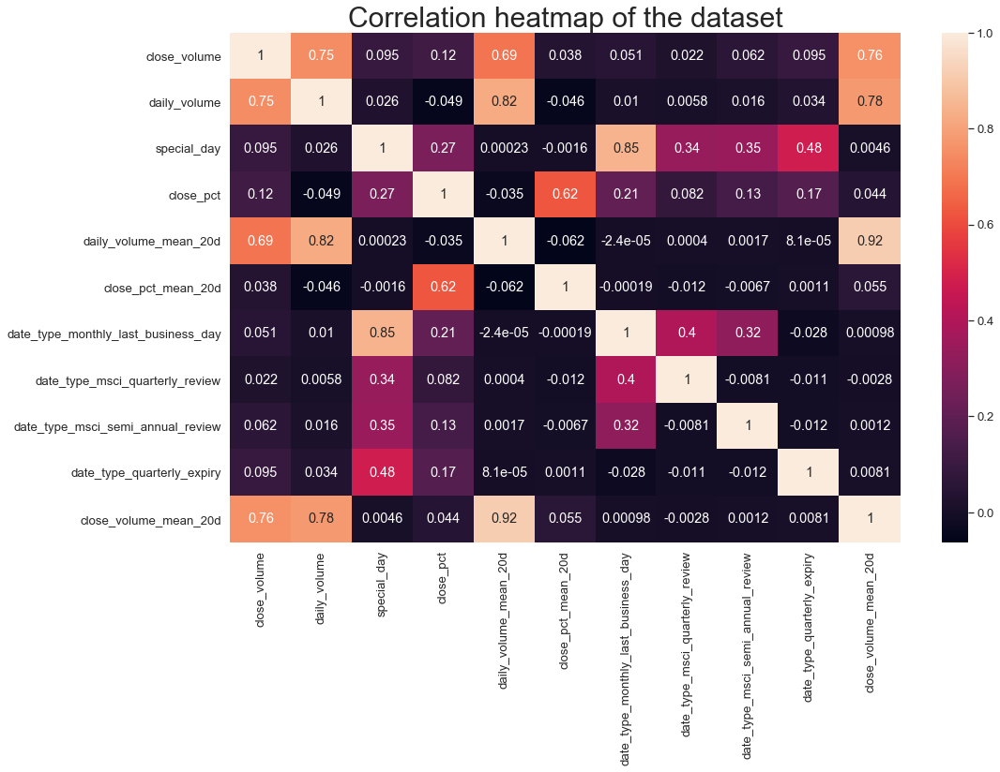

In [211]:
# plotting a correlation heatmap
plt.rcParams['figure.figsize'] = (16, 10)
sns.set(font_scale=1.2) 
sns.heatmap(df.corr(), annot = True)
plt.title('Correlation heatmap of the dataset', fontsize = 30)
plt.show()

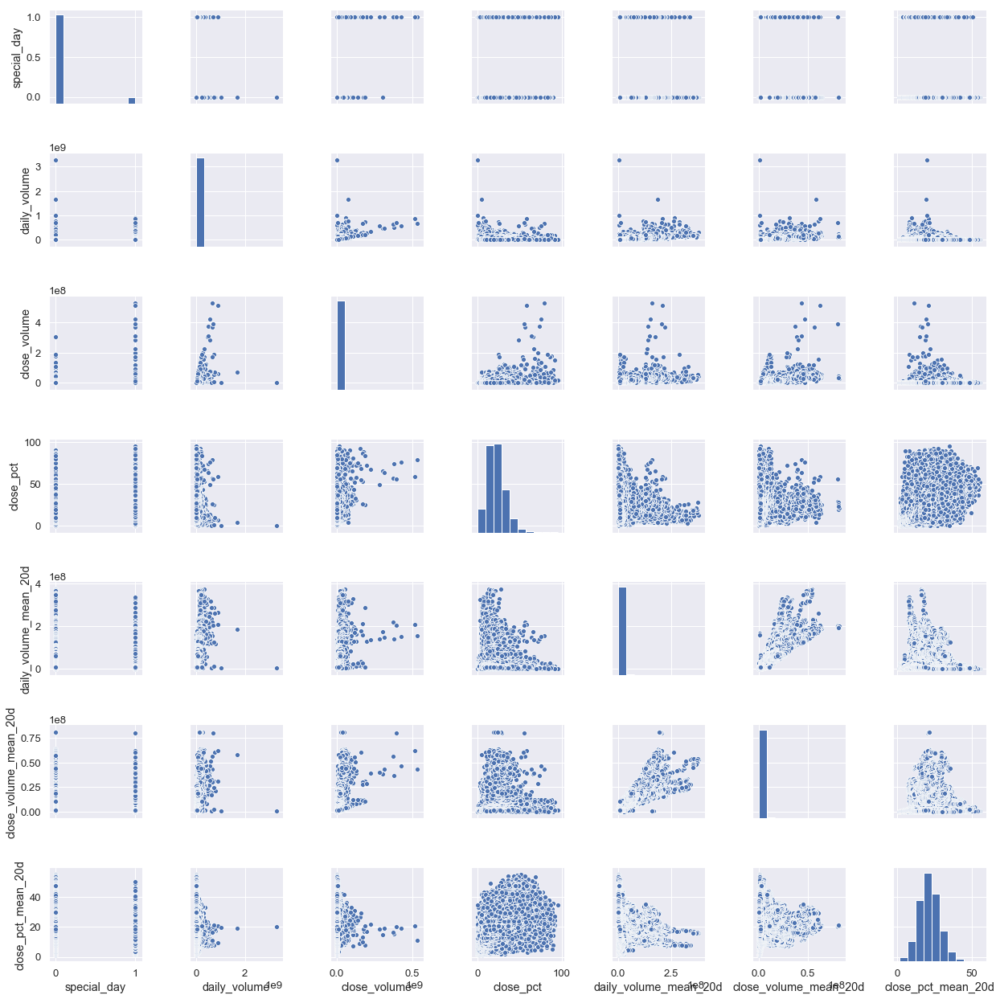

In [222]:
# let's visualise our data as a pairplot (excluding the 0/1 flag columns)
sns.pairplot(df[df.columns[3:10]])

From the previous two plots we can confirm the following insights (validating our conclusions from the results obtained with pandas_profiling):

* `close_volume`, `daily_volume` and `daily_volume_mean_20d` are highly skewed.
* `special_day` is not well balanced, the 'regular' class having a much higher frequency than the 'special_day' class.

Therefore:

* We will **consider certain transformations** to be applied to `close_volume`, `daily_volume`, `daily_volume_mean_20d` and **inspect the impact on our models**.
* We will be wary of the fact that `special_day` is not balanced and **avoid models which are known to be sensitive to unbalanced data** (e.g. decision trees).

Regarding close volumes, it seems that they take a **much wider range of values on a special day** (special_day==1).

Let's drill further in the relationship between close_volume and special_day.

### 5.2 Impact of special_day on daily_volume and close_volume
To complete this task we will consider **average daily volumes across all tickers**.

In [60]:
def compute_average_daily_volume_all_tickers():
    # let's compute a daily average of our volumes across all tickers
    df_ = df.groupby(['date']).mean().reset_index()
    # recomputing close_pct and close_pct_mean_20d for average daily volumes
    df_['close_pct'] =  100 * df_.close_volume / df_.daily_volume
    df_['close_pct_mean_20d'] =  100 * df_.close_volume_mean_20d / df_.daily_volume_mean_20d
    # let's add a numerical features for each component of the date field
    df_['weekday'] = df_.date.dt.weekday
    df_['day'] = df_.date.dt.day
    df_['week'] = df_.date.dt.week
    df_['month'] = df_.date.dt.month
    df_['year'] = df_.date.dt.year
    # let's compute log transform for those 3 volume features
    df_['log_daily_volume'] = np.log(df_['daily_volume'])
    df_['log_close_volume'] = np.log(df_['close_volume'])
    df_['log_close_pct'] = np.log(df_['close_pct'])
    df_['log_daily_volume_mean_20d'] = np.log(df_['daily_volume_mean_20d'])
    df_['log_close_volume_mean_20d'] = np.log(df_['close_volume_mean_20d'])
    df_['log_close_pct_mean_20d'] = np.log(df_['close_pct_mean_20d'])
    return df_

In [61]:
# compute average daily volume across all tickers
df_avg = compute_average_daily_volume_all_tickers()
df_avg.head()

,date,special_day,daily_volume,close_volume,close_pct,daily_volume_mean_20d,close_volume_mean_20d,close_pct_mean_20d,date_type_monthly_last_business_day,date_type_msci_quarterly_review,...,day,week,month,year,log_daily_volume,log_close_volume,log_close_pct,log_daily_volume_mean_20d,log_close_volume_mean_20d,log_close_pct_mean_20d
0,2010-02-01,0,6.238964e+06,7.366012e+05,11.806465,7.361101e+06,800025.878169,10.868291,0.0,0.0,...,1,5,2,2010,15.646325,13.509802,2.468647,15.811720,13.592399,2.385850
1,2010-02-02,0,7.777514e+06,7.509254e+05,9.655082,7.304994e+06,804255.869718,11.009672,0.0,0.0,...,2,5,2,2010,15.866747,13.529062,2.267484,15.804069,13.597673,2.398774
2,2010-02-03,0,8.058028e+06,7.680594e+05,9.531604,7.327495e+06,816066.886972,11.137052,0.0,0.0,...,3,5,2,2010,15.902179,13.551622,2.254613,15.807144,13.612252,2.410278
3,2010-02-04,0,1.056374e+07,9.458880e+05,8.954103,7.474974e+06,817255.013732,10.933216,0.0,0.0,...,4,5,2,2010,16.172938,13.759879,2.192112,15.827071,13.613706,2.391805
4,2010-02-05,0,1.299794e+07,1.640257e+06,12.619365,7.640936e+06,855261.157394,11.193147,0.0,0.0,...,5,5,2,2010,16.380301,14.310364,2.535233,15.849031,13.659162,2.415302


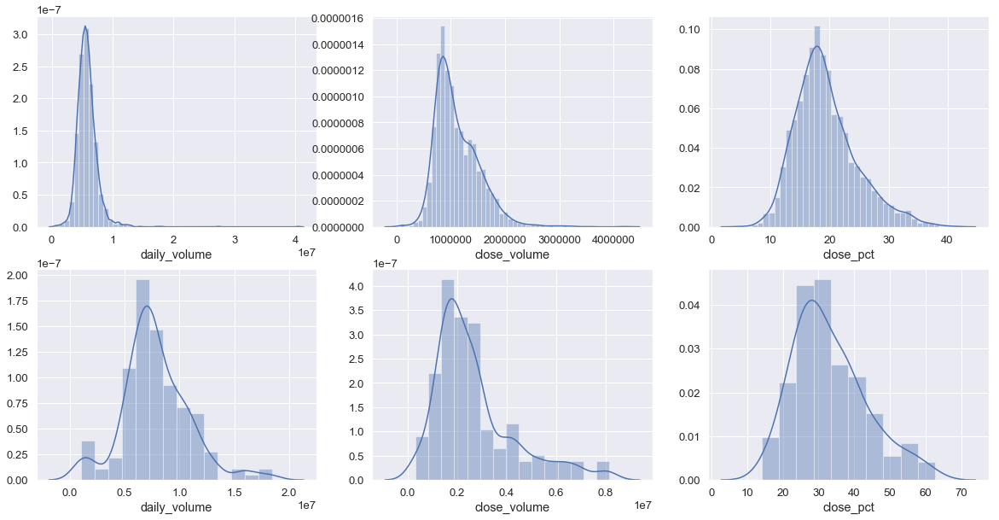

In [256]:
# now let's visualize the distribution of these features
f, axes = plt.subplots(2, 3, figsize=(20, 10))
sns.distplot(df_avg[(df_avg.special_day==0)].daily_volume, ax=axes[0, 0])
sns.distplot(df_avg[(df_avg.special_day==0)].close_volume, ax=axes[0, 1])
sns.distplot(df_avg[(df_avg.special_day==0)].close_pct, ax=axes[0, 2])
sns.distplot(df_avg[(df_avg.special_day==1)].daily_volume, ax=axes[1, 0])
sns.distplot(df_avg[(df_avg.special_day==1)].close_volume, ax=axes[1, 1])
sns.distplot(df_avg[(df_avg.special_day==1)].close_pct, ax=axes[1, 2])

From the previous distribution figure, we can see in the first row, volume features for regular days and in the second row, the same for special days.

We can see that all 3 features are skewed, especially close_volume.

**To mitigate the impact on this skewness on our model, we will apply a log transform onto volume features.**

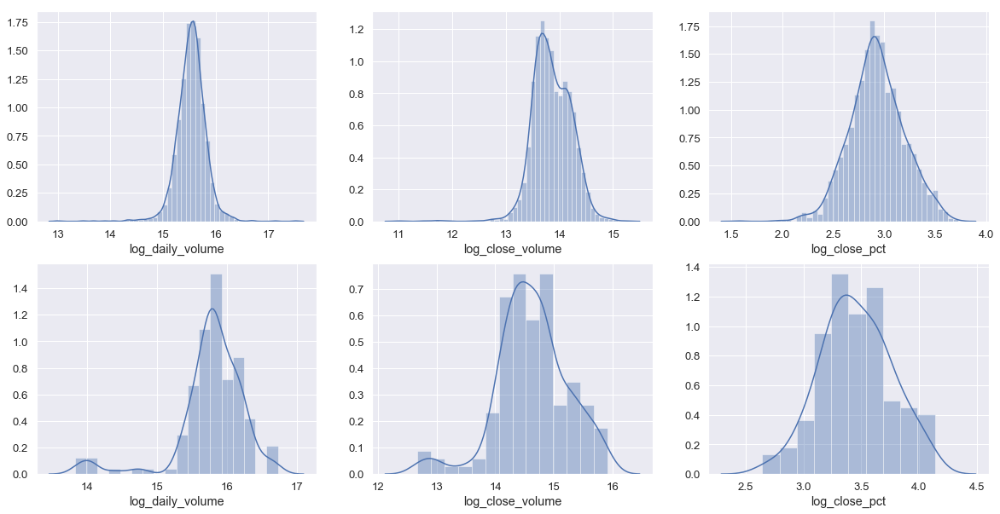

In [257]:
# now let's visualize the distribution of these log transformed features
f, axes = plt.subplots(2, 3, figsize=(20, 10))
sns.distplot(df_avg[(df_avg.special_day==0)].log_daily_volume, ax=axes[0, 0])
sns.distplot(df_avg[(df_avg.special_day==0)].log_close_volume, ax=axes[0, 1])
sns.distplot(df_avg[(df_avg.special_day==0)].log_close_pct, ax=axes[0, 2])
sns.distplot(df_avg[(df_avg.special_day==1)].log_daily_volume, ax=axes[1, 0])
sns.distplot(df_avg[(df_avg.special_day==1)].log_close_volume, ax=axes[1, 1])
sns.distplot(df_avg[(df_avg.special_day==1)].log_close_pct, ax=axes[1, 2])

`close_volume` is much less skewed now.

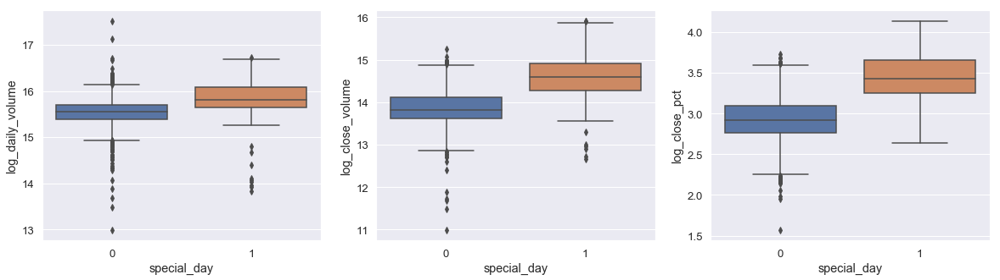

In [231]:
# let's look at boxplots now
f, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(x='special_day', y='log_daily_volume',data=df_avg, ax=axes[0])
sns.boxplot(x='special_day', y='log_close_volume',data=df_avg, ax=axes[1])
sns.boxplot(x='special_day', y='log_close_pct',data=df_avg, ax=axes[2])

**Volumes on special days are clearly significantly higher** than on normal days.

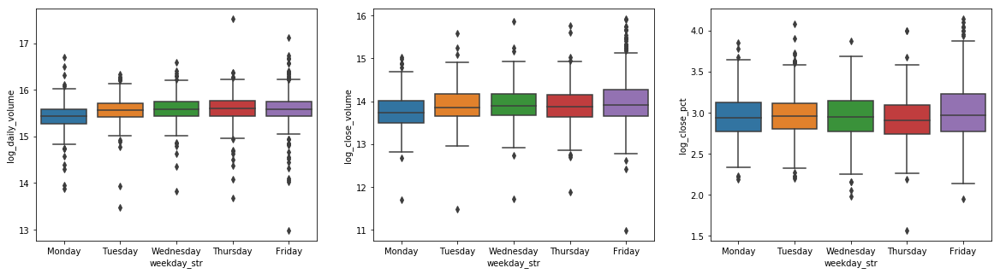

In [29]:
# let's look at whether the day of the week has any impact on volumes
# let's first re-establish the weekday string column in our average volume dataframe
df_avg['weekday_str'] = df_avg.date.dt.weekday_name
# then plot a boxplot for our 3 volume features
f, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(x='weekday_str', y='log_daily_volume',data=df_avg, ax=axes[0])
sns.boxplot(x='weekday_str', y='log_close_volume',data=df_avg, ax=axes[1])
sns.boxplot(x='weekday_str', y='log_close_pct',data=df_avg, ax=axes[2])

These plots show:

1. `Monday` is **much quieter** than any other days with significantly lower volumes.
2. `close_volume` and `close_pct` take a wider range of value on `Friday`, **arguably because quite a few special days fall on Fridays** as the following bar chart proves:



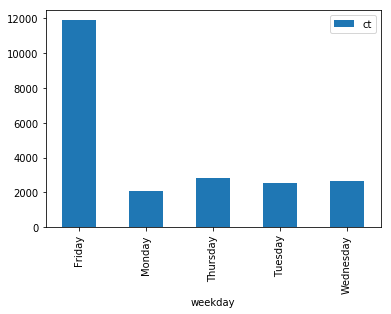

In [30]:
df[df.special_day==1][['ticker', 'weekday']].groupby(['weekday']).count().rename(columns={'ticker': 'ct'}).reset_index().plot.bar(x='weekday', y='ct')



### 5.1 Visualising `daily_volume`

In [62]:
def chart_one_measure(measure, x_range_init=None):
    tools = [CrosshairTool(), ZoomInTool(), ZoomOutTool(), PanTool(), BoxZoomTool()]
    
    p = figure(plot_width=1600, plot_height=550, x_axis_type="datetime", tools=tools, x_range=x_range_init)
    p.title.text = measure

    data_dict = dict()
    tickers = [measure] +['Monthly Last Business Day', 'MSCI Quarterly Review', 'MSCI Semi Annual Review', 'Quarterly Expiry']
    conditions = ['', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review',
                  'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']
    colors = ['darkgrey', 'crimson', 'blue', 'darkgreen', 'orange']

    for ticker_, cond_, color_ in zip(tickers, conditions, colors):
        if cond_ == '':
            df_chart = df_avg
        else:
            df_chart = df_avg.loc[df_avg[cond_]==1]

        li = p.line(df_chart['date'], df_chart[measure], line_width=2, color=color_, alpha=0.8, legend=ticker_)
        if cond_ == '':
            p.add_tools(HoverTool(renderers=[li], tooltips=[('date', '@x{%F}'), (measure, '@y{0,0}')], mode='vline', formatters={'x': 'datetime'}))
        else:
            p.circle(df_chart['date'], df_chart[measure], fill_color=color_, size=8)

        data_dict[ticker_] = ColumnDataSource(ColumnDataSource.from_df(df_chart))

    p.legend.location = "top_left"
    p.legend.click_policy="hide"
    p.yaxis.formatter = NumeralTickFormatter(format="0,0")

    y_range_callback = CustomJS(args=dict(plot=p, source=data_dict, tickers=tickers, measure=measure), code="""var Xstart=plot.x_range.start,Xend=plot.x_range.end;function sGE(a){return a>=Xstart}function eGE(a){return a>=Xend}function fixstart(a){return 0<=a?a:x.length-20}function fixend(a){return 0<a?a:x.length-1}for(var data=source[tickers[0]].data,x=data.date,Istart=fixstart(x.findIndex(sGE)),Iend=fixend(x.findIndex(eGE)),ymin=999999999999,ymax=-99999999999,i=0;i<tickers.length;i++){data=source[tickers[i]].data;var y=data[measure],yview=y.slice(Istart,Iend+1);ymin=Math.min(...yview,ymin),ymax=Math.max(...yview,ymax)}var dy=ymax-ymin,margin=.2*dy,last_range=plot.y_range.end-plot.y_range.start,new_range=ymax+margin-(ymin-margin),variation=Math.abs((new_range-last_range)/last_range);.05<variation&&(plot.y_range.start=ymin-margin,plot.y_range.end=ymax+margin);""")

    p.y_range.callback = y_range_callback

    show(p)

In [30]:
# let's plot average daily volumes with an initial zoom on the period April-June 2014
x_range_init = (pd.to_datetime(df_avg.loc[df_avg.date>='2014-05-01', 'date'].head(1).values[0]), pd.to_datetime(df_avg.loc[df_avg.date>='2014-07-01', 'date'].head(1).values[0]))
display(chart_one_measure('daily_volume', x_range_init))

None

What can be learnt from this chart:
1. `Quarterly Expiry` seems to be the most correlated to a spike in **daily_volume_mean**
2. `MSCI Semi Annual Review` seems to be the second most correlated to a spike in **daily_volume_mean**
3. By zooming on the 2014 April-June period you can see that 2 `MSCI Semi Annual Review` are closed to one another:
        a. one is on 2014-05-28 and has low volume
        b. one is on 2014-05-30 and has high volume
   We will remove the `MSCI Semi Annual Review` flag for 2014-05-28 as it seems to be a glitch in the raw data.

In [63]:
# let's remove MSCI Semi Annual Review flag for 2014-05-28
df.loc[df_new.date=='2014-05-28', 'date_type_msci_semi_annual_review'] = 0

# let's re-compute average daily volume across all tickers
df_avg = compute_average_daily_volume_all_tickers()

In [64]:
# let's plot again the average daily volumes with an initial zoom on the period April-June 2014
x_range_init = (pd.to_datetime(df_avg.loc[df_avg.date>='2014-05-01', 'date'].head(1).values[0]), pd.to_datetime(df_avg.loc[df_avg.date>='2014-07-01', 'date'].head(1).values[0]))
display(chart_one_measure('daily_volume', x_range_init))

None

**This anomaly is now gone.**

In [33]:
# let's plot more volume related measures to get a feel of which might be more correlated to our special days
display(chart_one_measure('daily_volume'))
display(chart_one_measure('close_volume'))
display(chart_one_measure('close_pct'))
display(chart_one_measure('close_volume_mean_20d'))
display(chart_one_measure('close_pct_mean_20d'))

None

None

None

None

None

Looking at these charts it seems that predicting `close_volume_mean_20d` and `close_pct_mean_20d` would be much easier than `close_volume` and `close_pct` which makes sense as they're smoothed and less noisy.

## 6. Modelization

### 6.1. Defining utility functions
As we will be exploring many linear and non linear models, we create functions to serve the following purposes:
1. Create train and test datasets
2. Orchestrate the modelization pipeline which consists of the following tasks:<br>
    2.1. Create train and test datasets<br>
    2.2. Train models<br>
    2.3. Evaluate models<br>
    2.4. Collect metrics to compare the performance of all models

#### 6.1.1 Defining the dataset creation function

In [65]:
def create_dataset(df_, test_size_, features_, features_shifts_, target_col_name_, with_normalization_=True, random_state_=1234, show_log_=False):
    """
    :param df_: input dataframe containing both features and targets.
    :param test_size_: size of the test dataset in percentage of the total size of the input dataframe.
    :param target_col_name_: the name of the column to predict.
    :param with_normalization: if True the dataset is normalized, otherwize it is left as is. 
    :param random_state_: seed for the random number generator used by sklearn.
    :param show_log_: if True prints log to the console
    :return: x_train, x_test, y_train, y_test corresponding to features and targets for train and test datasets.
    """
    # let's start by taking a copy of the input dataframe
    df = df_.copy()
    # let's use the 'date' column as the index for our new dataframe df
    df = df.set_index('date')
    
    # now let's make sure we're not leaking data into the future by reviewing at which date D our features and targets will taken from:
    # 1. Targets: for each sample at date D, the target we will try to predict is given by target_col_name_ at date D
    # 2. Special Days Features and weekday: all date_type features and weekday at date D can be used for date D prediction as their values are know well in advance
    # 3. Previous target_col_name_ feature and any other 20-day average feature: for each sample at date D, these feature will be brought one day forward from D-1 to D as their values
    # on date D are only known at the end of the day on D meaning they cannot be used to make a prediction on day D 
    
    # compute previous target_col_name_ value
    prev_target_col_name_ = 'prev_{}'.format(target_col_name_)
    df[prev_target_col_name_] = df[target_col_name_].shift(1)
    
    # let's shift feature columns as specified by features_shifts_:
    # in the process we rename the new features with the following naming convention:
    #       *if shift_value > 0: {feature_name}_{p}{shift_value} (p as in positif)
    #       *if shift_value < 0: {feature_name}_{n}{shift_value} (n as in negatif)
    #       *if shift_value == 0: feature_name  (as in we don't change the feature name)
    new_features_ = list()
    for feature, shift_value in zip(features_, features_shifts_):
        new_feature_name = feature
        if shift_value != 0:
            new_feature_name = '{}_{}{}'.format(feature, 'p' if shift_value > 0 else 'n', shift_value)
        df[new_feature_name] = df[feature].shift(shift_value)
        new_features_.append(new_feature_name)
    
    features_ = new_features_
    # let's only keep relevant columns (features + targets)
    features_ = [prev_target_col_name_] + features_
    targets_ = [target_col_name_]
    df = df[features_+targets_].dropna()

    if show_log_:
        print('features_: {}'.format(features_))
        print('targets_: {}'.format(targets_))
        print(df.head().to_string())
    
    # create train and test datasets
    x = df[features_]
    y = df[targets_]
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size_, random_state = random_state_, shuffle=False)
    
    # data normalization
    scaler = None
    if with_normalization_:
        # feature normalization
        scaler = StandardScaler()
        x_train = scaler.fit_transform(x_train)
        x_test = scaler.transform(x_test)
    
    return x_train, x_test, y_train, y_test, features_, x, y, scaler

#### 6.1.2 Defining the grid search function:

In [66]:
# run grid search with cross validation
def run_grid_search_cv(model, grid_params, x, y, cv_count=30):
    gs = GridSearchCV(model,
                      grid_params,
                      verbose=1,
                      cv=cv_count,
                      n_jobs = -1
                     )

    gs_results = gs.fit(x, y)

    print(gs_results.best_score_)
    print(gs_results.best_estimator_)
    print(gs_results.best_params_)
    return gs_results

#### 6.1.3 Defining the orchestration function

In [67]:
def run_pipeline(df_, models_, test_size_, features_, features_shifts_, target_col_name_, with_normalization_=True, random_state_=1234, show_log_=False):
    """
    :param df_: input dataframe containing both features and targets.
    :param models_: list of models to work with.
    :param models_params: list of model specific parameters to use.
    :param test_size_: size of the test dataset in percentage of the total size of the input dataframe.
    :param target_col_name_: the name of the column to predict.
    :param with_normalization: if True the dataset is normalized, otherwize it is left as is. 
    :param random_state_: seed for the random number generator used by sklearn.
    :param show_log_: if True prints log to the console
    :return: x_train, x_test, y_train, y_test corresponding to features and targets for train and test datasets.
    """
    
    # create train and test datasets
    x_train, x_test, y_train, y_test, features_final, x, y, scaler = create_dataset(df_, test_size_, features_, features_shifts_, target_col_name_, with_normalization_=with_normalization_, random_state_=random_state_, show_log_=show_log_)
    
    # train and evaluate each models
    kpi = dict()
    for model_id, [model, model_params, model_grid_params] in models_.items():
        print('Start processing: {} of class {} with params {}'.format(model_id, model.__class__.__name__, model_params))
        start_time = time.time()
        
        is_model_trained = False
        # run grid search if required
        if model_grid_params:
            print('Running GridSearchCV for model: {}'.format(model_id))
            gs_results = run_grid_search_cv(model, model_grid_params, x_train, y_train, cv_count=5)
            model_params = gs_results.best_params_
            models_[model_id][0] = gs_results.best_estimator_
            model = models_[model_id][0]
            is_model_trained = True
        
        if not is_model_trained:
            # setup model's parameters
            if model_params:
                if model_id == 'LightGBM_Regressor':
                    model.set_params(model_params)
                else:
                    model.set_params(**model_params)

            # model training
            if model_id == 'LightGBM_Regressor':
                model.fit(x_train, y_train, x_test, y_test)
            else:
                model.fit(x_train, y_train)

        # model predictions with both train and test datasets
        y_train_preds = model.predict(x_train)
        y_test_preds = model.predict(x_test)
        
        # model evaluation using MSE and R2
        train_mse = mean_squared_error(y_train, y_train_preds)
        train_mae = mean_absolute_error(y_train, y_train_preds)
        train_r2 = r2_score(y_train, y_train_preds)
        test_mse = mean_squared_error(y_test, y_test_preds)
        test_mae = mean_absolute_error(y_test, y_test_preds)
        test_r2 = r2_score(y_test, y_test_preds)
        
        # model accuracy using cross validation
        if model_id == 'LightGBM_Regressor':
            scores_mean = 0
            scores_std = 0
        else:
            scores = cross_val_score(model, x_train, y_train, cv=5)
            scores_mean = scores.mean()
            scores_std = scores.std()
        
        end_time = time.time()

        kpi[model_id] = {'train_mse': train_mse,
                         'train_r2': train_r2,
                         'train_mae': train_mae,
                         'test_mse': test_mse, 
                         'test_r2': test_r2,
                         'test_mae': test_mae,
                         'train_acc': scores_mean,
                         'train_std': scores_std,
                         'processing_time': end_time - start_time
                        }
        
    kpi_df = pd.DataFrame([v for k, v in kpi.items()], index=list(kpi.keys()))
    dataset = {'features': features_final, 'target': target_col_name_,
               'x': x, 'y': y, 'x_train': x_train, 'x_test': x_test, 'y_train': y_train, 'y_test': y_test,
               'scaler': scaler}
    return kpi_df, dataset

def show_pipeline_results(features_final, kpis, kpis_sort_field='test_r2'):
    pd.options.display.max_columns = None
    pd.options.display.max_colwidth = 400
    pd.set_option('display.float_format', lambda x: '%.3f' % x)
    print('features_final: {}'.format(features_final))
    display(kpis.sort_values([kpis_sort_field], ascending=False))

#### 6.1.4 Defining a function to plot actuals vs predictions

In [68]:
def chart_predictions(x, y, x_train, y_train, x_test, y_test, models, model_names, x_range_init=None):
    """
    :param x: the original feature matrix (dataframe).
    :param y: the original target vector (dataframe).
    :param x_train: the normalized train feature vectors (ndarray).
    :param y_train: the normalized train target vector (ndarray).
    :param x_test: the normalized test feature vectors (ndarray).
    :param y_test: the normalized test feature vector (ndarray).
    :param models: dict of all models.
    :param model_names: list of all model names we wish to plot predictions for.
    :param target_name: name of the predicted column.
    :return: None.
    """
    tools = [CrosshairTool(), ZoomInTool(), ZoomOutTool(), PanTool(), BoxZoomTool()]
    
    p = figure(plot_width=1600, plot_height=550, x_axis_type="datetime", tools=tools, x_range=x_range_init)
    measure = y.columns[0]
    p.title.text = measure

    data_dict = dict()
    model_names = ['actual'] + model_names
    
    # getting some colors
    colors = ['black'] + Category20[20]

    # plotting a verticle black ray to separate train and test data
    p.ray(x = y.index[x_train.shape[0]-1], y = 0, length = 0, angle_units = "deg",
      angle = 90, color = 'black', line_width=2)
    
    for model_name_, color_ in zip(model_names, colors):
        if model_name_ == 'actual':
            # case to handle the true target data held in variable y
            df_chart = y
            line_alpha = 1
        elif model_name_.find('arima')>0:
            # case to handle arima based models
            line_alpha = 0.5
            model = models[model_name_][0]
            
            # for arima based model, predictions can be obtained from the model's object directly
            df_chart = model.df_preds
        else:
            # case to handle any other models
            line_alpha = 0.5
            model = models[model_name_][0]
            df_chart = y.copy()
            df_chart[measure] = np.hstack([model.predict(x_train).ravel(), model.predict(x_test).ravel()])

        li = p.line(df_chart.index, df_chart[measure], line_width=2, color=color_, alpha=0.8, legend=model_name_, line_alpha=line_alpha)
        p.add_tools(HoverTool(renderers=[li], tooltips=[('date', '@x{%F}'), (model_name_, '@y{0,0}')], mode='vline', formatters={'x': 'datetime'}))
        
        data_dict[model_name_] = ColumnDataSource(ColumnDataSource.from_df(df_chart))

    # draw circle for special days
    index_ = x.loc[x.special_day==1].index
    values_ = y.loc[index_][measure]
    p.circle(index_, values_, fill_color='black', size=8)
    
    p.legend.location = "top_left"
    p.legend.click_policy="hide"
    p.yaxis.formatter = NumeralTickFormatter(format="0,0")

    y_range_callback = CustomJS(args=dict(plot=p, source=data_dict, tickers=model_names, measure=measure), code="""var Xstart=plot.x_range.start,Xend=plot.x_range.end;function sGE(a){return a>=Xstart}function eGE(a){return a>=Xend}function fixstart(a){return 0<=a?a:x.length-20}function fixend(a){return 0<a?a:x.length-1}for(var data=source[tickers[0]].data,x=data.date,Istart=fixstart(x.findIndex(sGE)),Iend=fixend(x.findIndex(eGE)),ymin=999999999999,ymax=-99999999999,i=0;i<tickers.length;i++){data=source[tickers[i]].data;var y=data[measure],yview=y.slice(Istart,Iend+1);ymin=Math.min(...yview,ymin),ymax=Math.max(...yview,ymax)}var dy=ymax-ymin,margin=.2*dy,last_range=plot.y_range.end-plot.y_range.start,new_range=ymax+margin-(ymin-margin),variation=Math.abs((new_range-last_range)/last_range);.05<variation&&(plot.y_range.start=ymin-margin,plot.y_range.end=ymax+margin);""")

    p.y_range.callback = y_range_callback

    show(p)

#### 6.1.5 Defining the models

In [69]:
# let's create a class to support the sklearn API (fit, predict) for lightgbm
class LightGBM_Regressor:
    def __init__(self):
        self.params = None
        self.model = None
        
    def set_params(self, params):
        self.params = params
    
    def fit(self, x_train, y_train, x_test, y_test):
        d_train = lgb.Dataset(x_train, label=y_train)
        d_valid = lgb.Dataset(x_test, label=y_test)
    
        self.model = lgb.train(self.params, d_train, valid_sets=d_valid, verbose_eval=0, num_boost_round=200)
        
    def predict(self, x_test):
        if self.model is None:
            return np.array()
        
        return self.model.predict(x_test)

In [70]:
def models_init():
    """
    Defines the models that will be considered during training and testing.
    Having a function to do this task will allow us to re-initialize all considered model between each experiments.
    """
    # below 'models' variable is a dictionary which defines the models, their parameters as well as grid search parameters if required.
    # its structure is as follow:
    #         'key': [model_instance(), {model_params}, {grid_search_params}]
    models = {'LinearRegression': [LinearRegression(), {}, {}],
              'Ridge': [Ridge(), {}, {}],
              'Ridge GS': [Ridge(alpha=10.0, copy_X=True, fit_intercept=True, max_iter=None, normalize=False, random_state=None, solver='saga', tol=0.001), {}, {}],
              'Lasso': [Lasso(), {}, {}],
              'Lasso GS': [Lasso(), {}, {'alpha': [1.0, 5.0, 10.0, 0.1, 0.01],  'tol': [0.0001, 0.001, 0.01]}],
              'ElasticNet': [ElasticNet(), {}, {}],
              'ElasticNet GS': [ElasticNet(), {}, {'alpha': [1.0, 5.0, 10.0, 0.1, 0.01], 'l1_ratio': [1, 0, 0.5]}],
              'Lars': [Lars(), {}, {}],
              'Lars GS': [Lars(), {}, {'n_nonzero_coefs': [500, 400]}],
              'OrthogonalMatchingPursuit': [OrthogonalMatchingPursuit(), {}, {}],
              'BayesianRidge': [BayesianRidge(), {}, {}],
              'BayesianRidge GS': [BayesianRidge(), {}, {'n_iter': [300, 200, 400], 'tol': [0.001, 0.01, 0.1, 0.0001], 'alpha_1': [1e-06, 1e-05, 1e-04], 'alpha_2': [1e-06, 1e-05, 1e-04], 'lambda_1': [1e-06, 1e-05, 1e-04], 'lambda_2': [1e-06, 1e-05, 1e-04]}],
              'SGDRegressor': [SGDRegressor(), {}, {}],
              'SGDRegressor GS': [SGDRegressor(), {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}, {}],
              'PassiveAggressiveRegressor': [PassiveAggressiveRegressor(), {}, {}],
              'PassiveAggressiveRegressor GS': [PassiveAggressiveRegressor(), {}, {'C': [1, 10, 100, 0.1], 'max_iter': [1000, 500, 1500, 2000], 'tol': [1e-04, 1e-03, 1e-02]}],
              'HuberRegressor': [HuberRegressor(), {}, {}],
              'HuberRegressor GS': [HuberRegressor(), {}, {'epsilon': [1, 1.35, 2.0, 2.5], 'max_iter': [100, 300, 500], 'alpha': [1e-02, 1e-03, 1e-04, 1e-05], 'tol': [1e-05, 1e-04, 1e-03]}],
              'DecisionTreeRegressor': [DecisionTreeRegressor(), {}, {}],
              'DecisionTreeRegressor GS': [DecisionTreeRegressor(), {}, {'criterion': ['mse', 'mae'], 'max_depth': [None, 5, 10, 50], 'min_samples_split': [2, 4, 8, 16], 'max_features': [None, 'auto', 'sqrt', 'log2']}],
              'KNeighborsRegressor': [KNeighborsRegressor(), {}, {}],
              'KNeighborsRegressor GS': [KNeighborsRegressor(), {}, {'n_neighbors': [3, 5, 7, 10, 15], 'weights': ['uniform', 'distance'], 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                                                                     'leaf_size': [10, 30, 50], 'p': [1, 1.5, 2]}],
              'SVR': [SVR(), {'gamma': 'scale'}, {}],
              #'SVR GS': [SVR(), {}, {'kernel': ['linear', 'poly'], 'degree': [2, 3, 5], 'gamma': ['scale', 'auto'], 'coef0': [0, 0.5],
              #                       'tol': [1e-03, 1e-2], 'C': [1, 10], 'epsilon': [1e-1, 1e-2]}],
              #'SVR rs GS': [SVR(), {}, {'kernel': ['rbf', 'sigmoid'], 'degree': [2, 3, 5], 'gamma': ['scale', 'auto'], 'coef0': [0, 0.5],
              #                       'tol': [1e-03, 1e-2], 'C': [1, 10], 'epsilon': [1e-1, 1e-2]}],
              #'NuSVR': [NuSVR(), {'gamma': 'scale'}, {}],
              #'NuSVR GS': [NuSVR(), {}, {'nu': [0.2, 0.5, 0.7], 'C': [1, 10, 100], 'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'degree': [3, 5],
              #                           'gamma': ['scale', 'auto'], 'tol': [1e-02, 1e-03],}],
              #'LinearSVR': [LinearSVR(), {}, {}],
              #'LinearSVR GS': [LinearSVR(), {}, {'epsilon': [0], 'tol': [1e-02, 1e-03], 'C': [1, 10, 100],
              #                                'loss': ['epsilon_insensitive', 'squared_epsilon_insensitive'], 'dual': [True], 'max_iter': [1000, 500, 2000]}],
              'KernelRidge': [KernelRidge(), {}, {}],
              'KernelRidge GS': [KernelRidge(), {}, {'alpha': [1, 2, 10], 'kernel': ['linear'], 'degree': [2, 3, 5]}],
              'LightGBM_Regressor': [LightGBM_Regressor(), {'boosting_type': 'gbdt',
                                                        'objective': 'regression',
                                                        'metric': {'rmse'},
                                                        'learning_rate': 0.5,
                                                        'num_leaves': 150,
                                                        'verbose': 0}, {}]
             }
    return models

### 6.2. Predicting `close_volume` 

#### 6.2.1. Experiment 1

In [237]:
# establishing a baseline model
models = models_init()
test_size = 0.3
target_col_name = 'close_volume'
features = ['special_day', 'weekday', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']
features_shifts = [0, 0, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done  60 out of  75 | elapsed:    3.3s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.552026980822256
Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.01, 'tol': 0.0001}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.5665416295971263
ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.1, 'l1_ratio': 0}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.5520269830309436
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}
Start processing: BayesianRidge GS of class BayesianRidge with params {}
Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


[Parallel(n_jobs=-1)]: Done 304 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 2704 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    8.2s finished


0.5555150260682195
BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-05, lambda_2=0.0001, n_iter=300,
       normalize=False, tol=0.01, verbose=False)
{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'lambda_1': 1e-05, 'lambda_2': 0.0001, 'n_iter': 300, 'tol': 0.01}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.5508813808127127
PassiveAggressiveRegressor(C=100, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=500, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.0001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 100, 'max_iter': 500, 'tol': 0.0001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.5598883629651901
HuberRegressor(alpha=0.0001, epsilon=2.5, fit_intercept=True, max_iter=100,
        tol=1e-05, warm_start=False)
{'alpha': 0.0001, 'epsilon': 2.5, 'max_iter': 100, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    2.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.6008937657736483
DecisionTreeRegressor(criterion='mae', max_depth=5, max_features='log2',
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=16, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mae', 'max_depth': 5, 'max_features': 'log2', 'min_samples_split': 16}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS
Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 910 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 1410 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:   32.2s finished


0.6059911723043672
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=10, p=2,
          weights='uniform')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 10, 'p': 2, 'weights': 'uniform'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  45 | elapsed:    1.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.2s finished


-3.6330197105572797
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [238]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_volume', 'special_day', 'weekday', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
KNeighborsRegressor,70711628929.440,0.758,162888.446,447359299533.059,0.289,466612.353,0.536,0.079,0.062
KNeighborsRegressor GS,79289524205.510,0.729,171869.019,451079051749.773,0.283,456384.139,0.606,0.050,32.381
DecisionTreeRegressor,458111.224,1.000,23.900,508185844478.515,0.192,507164.843,0.222,0.291,0.036
LightGBM_Regressor,29751208622.669,0.898,114753.303,521850083075.338,0.170,479746.780,0.000,0.000,0.744
DecisionTreeRegressor GS,99834397522.762,0.659,179657.505,544754121357.361,0.134,534700.835,0.529,0.106,2.639
LinearRegression,104509703327.495,0.643,209515.553,552991525081.213,0.121,575413.035,0.552,0.055,0.027
Lars GS,104509703327.495,0.643,209515.553,552991525081.214,0.121,575413.035,0.552,0.055,0.100
Lars,104509703327.495,0.643,209515.553,552991525081.214,0.121,575413.035,0.552,0.055,0.057
Lasso GS,104509703327.514,0.643,209515.550,552991566664.789,0.121,575413.051,0.552,0.055,3.486
Lasso,104509703516.648,0.643,209515.316,552995683264.204,0.121,575414.572,0.552,0.055,0.037


In [67]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
#top_5_model_names = ['ElasticNet', 'ElasticNet GS']
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

We can see that the baseline models already show a decent ability to predict spikes in close volume for special days.

Outside of special days the models struggle a little more.

#### 6.2.2. Experiment 2

In [385]:
# using more available features to improve our baseline model
# we're adding 'daily_volume', 'daily_volume_mean_20d', 'close_volume_mean_20d' and 'close_pct_mean_20d'
# we're making sure to shift forward those additional 4 features by 1 period to avoid forward-looking bias.
models = models_init()
test_size = 0.3
target_col_name = 'close_volume'
features = ['special_day', 'weekday', 'daily_volume', 'daily_volume_mean_20d', 'close_volume_mean_20d', 'close_pct_mean_20d', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']
features_shifts = [0, 0, 1, 1, 1, 1, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization, show_log_=False)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.6094805942861593
Lasso(alpha=10.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.01, warm_start=False)
{'alpha': 10.0, 'tol': 0.01}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.2s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.6131961485216602
ElasticNet(alpha=0.01, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.01, 'l1_ratio': 0.5}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits
-0.16633433602102232
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}
Start processing: BayesianRidge GS of class BayesianRidge with params {}
Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    6.6s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.61383149375442
BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-05, lambda_2=0.0001, n_iter=300,
       normalize=False, tol=0.01, verbose=False)
{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'lambda_1': 1e-05, 'lambda_2': 0.0001, 'n_iter': 300, 'tol': 0.01}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    4.0s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.6081594592441879
PassiveAggressiveRegressor(C=10, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=500, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.0001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 10, 'max_iter': 500, 'tol': 0.0001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 304 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:    3.6s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.6092629695432097
HuberRegressor(alpha=1e-05, epsilon=2.5, fit_intercept=True, max_iter=100,
        tol=1e-05, warm_start=False)
{'alpha': 1e-05, 'epsilon': 2.5, 'max_iter': 100, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    5.2s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.5875064709281687
DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=16, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mse', 'max_depth': 5, 'max_features': None, 'min_samples_split': 16}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS
Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 432 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 745 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 1095 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 1545 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.2min finished


0.6402035925942501
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=7, p=1,
          weights='distance')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.2s finished
C:\Users\thomas\Anaconda3\envs\ml368\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


-11.18440809321522
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [386]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_volume', 'special_day', 'weekday', 'daily_volume_p1', 'daily_volume_mean_20d_p1', 'close_volume_mean_20d_p1', 'close_pct_mean_20d_p1', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
SGDRegressor GS,94723138049.383,0.676,186153.627,244652475544.194,0.611,311482.875,0.613,0.050,0.963
Lars,98208710967.025,0.664,193797.655,262787696270.606,0.582,328930.598,-0.166,0.815,0.039
Lars GS,98208710967.025,0.664,193797.655,262787696270.606,0.582,328930.598,-0.166,0.815,0.090
LinearRegression,86679101269.441,0.704,181987.983,273128102727.116,0.566,321173.625,0.609,0.050,0.039
Lasso,86679101655.602,0.704,181986.981,273131987677.896,0.566,321174.005,0.609,0.050,0.064
Lasso GS,86679152194.617,0.704,181976.556,273172714321.741,0.566,321178.249,0.609,0.050,8.126
Ridge,86682823484.217,0.704,181896.804,273602134402.337,0.565,321234.288,0.613,0.046,0.030
BayesianRidge,86716885118.370,0.704,181720.501,274754218459.891,0.563,321478.345,0.614,0.044,0.053
BayesianRidge GS,86716885241.965,0.704,181720.501,274754221402.148,0.563,321478.345,0.614,0.044,6.798
ElasticNet GS,86831044211.367,0.703,181604.289,276752516231.744,0.560,322178.725,0.613,0.047,0.431


**We can see a clear improvement in out of sample R^2 and MAE.** 

In [70]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

#### 6.2.3. Experiment 3
In this experiment, we will seek to improve our model further by adding new features derived from existing ones using rolling measures and lags.

In [71]:
# first le'ts define a couple of utility function that will help us enrich our existing dataframe from which our train and test datasets are created from.
def compute_derived_feature(df, col_names, functions, suffix='', samples_query=None, add_to_source_df=False):
    if samples_query is not None:
        df_ = df.query(samples_query)[col_names].copy()
    else:
        df_ = df[col_names].copy()
        
    for function_type, function_param in functions:
        if function_type == 'rolling_mean':
            df_ = df_.rolling(function_param).mean()
            suffix = '{}_rmean{}'.format(suffix, function_param)
        elif function_type == 'rolling_min':
            df_ = df_.rolling(function_param).min()
            suffix = '{}_rmin{}'.format(suffix, function_param)
        elif function_type == 'rolling_max':
            df_ = df_.rolling(function_param).max()
            suffix = '{}_rmax{}'.format(suffix, function_param)
        elif function_type == 'rolling_std':
            df_ = df_.rolling(function_param).std()
            suffix = '{}_rstd{}'.format(suffix, function_param)
        elif function_type == 'shift' and function_param != 0:
            df_ = df_.shift(function_param)
            suffix = '{}_{}{}'.format(suffix, 'p' if function_param > 0 else 'n', function_param)
        
    col_names = df_.columns
    new_col_names = ['{}_{}'.format(c, suffix) for c in col_names]
    df_ = df_.rename(columns=dict(zip(col_names, new_col_names)))
    #df_ = df_.dropna()    
    
    if add_to_source_df:
        df = pd.concat([df, df_], axis=1, sort=False).ffill() #.dropna()
        return df
    
    return df_

def create_advanced_df(df):
    df_ = df.copy()
    
    # let's add a 5-day rolling mean for special day volumes, e.g. rolling.mean(5).shift(1) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 5), ('shift', 1)], suffix='sd', samples_query='special_day==1', add_to_source_df=True)
    # let's add a 2-day rolling mean for special day volumes, e.g. rolling.mean(2).shift(1) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 2), ('shift', 1)], suffix='sd', samples_query='special_day==1', add_to_source_df=True)
    
    # let's add a 5-day rolling mean for special day volumes, e.g. rolling.mean(5).shift(1) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 5), ('shift', 1)], suffix='sd_lbd', samples_query='(special_day==1) & (date_type_monthly_last_business_day==1)', add_to_source_df=True)
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 5), ('shift', 1)], suffix='sd_qr', samples_query='(special_day==1) & (date_type_msci_quarterly_review==1)', add_to_source_df=True)
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 5), ('shift', 1)], suffix='sd_sar', samples_query='(special_day==1) & (date_type_msci_semi_annual_review==1)', add_to_source_df=True)
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('rolling_mean', 5), ('shift', 1)], suffix='sd_qe', samples_query='(special_day==1) & (date_type_quarterly_expiry==1)', add_to_source_df=True)
    
    # let's add a 1-day lag for special day volumnes, e.g shift(1) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('shift', 1)], suffix='sd', samples_query='special_day==1', add_to_source_df=True)
    # let's add a 2-day lag for special day volumnes, e.g shift(2) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('shift', 2)], suffix='sd', samples_query='special_day==1', add_to_source_df=True)
    # let's add a 3-day lag for special day volumnes, e.g shift(3) for 'daily_volume', 'close_volume', 'close_pct' for samples with special_day==1
    df_ = compute_derived_feature(df_, ['daily_volume', 'close_volume', 'close_pct'], [('shift', 3)], suffix='sd', samples_query='special_day==1', add_to_source_df=True)
    
    return df_.dropna()

In [72]:
# from df_avg let's create our advanced dataframe
df_avg_adv =  create_advanced_df(df_avg)
df_avg_adv.head()

,date,special_day,daily_volume,close_volume,close_pct,daily_volume_mean_20d,close_volume_mean_20d,close_pct_mean_20d,date_type_monthly_last_business_day,date_type_msci_quarterly_review,...,close_pct_sd_qe_rmean5_p1,daily_volume_sd_p1,close_volume_sd_p1,close_pct_sd_p1,daily_volume_sd_p2,close_volume_sd_p2,close_pct_sd_p2,daily_volume_sd_p3,close_volume_sd_p3,close_pct_sd_p3
716,2012-11-30,1,5.818703e+06,2.184343e+06,37.540024,4.943971e+06,843106.900333,17.053234,1.0,0.0,...,29.701752,6.134595e+06,1.153827e+06,18.808534,4.956747e+06,1.244297e+06,25.103096,9.030751e+06,2.743719e+06,30.381956
717,2012-12-03,0,3.911035e+06,6.726603e+05,17.199034,5.043486e+06,848190.029000,16.817536,0.0,0.0,...,29.701752,6.134595e+06,1.153827e+06,18.808534,4.956747e+06,1.244297e+06,25.103096,9.030751e+06,2.743719e+06,30.381956
718,2012-12-04,0,3.825369e+06,7.118872e+05,18.609636,4.831064e+06,848074.821667,17.554616,0.0,0.0,...,29.701752,6.134595e+06,1.153827e+06,18.808534,4.956747e+06,1.244297e+06,25.103096,9.030751e+06,2.743719e+06,30.381956
719,2012-12-05,0,4.729381e+06,9.334631e+05,19.737534,4.783174e+06,849898.269000,17.768499,0.0,0.0,...,29.701752,6.134595e+06,1.153827e+06,18.808534,4.956747e+06,1.244297e+06,25.103096,9.030751e+06,2.743719e+06,30.381956
720,2012-12-06,0,4.638219e+06,8.010249e+05,17.270096,4.831593e+06,853510.518333,17.665197,0.0,0.0,...,29.701752,6.134595e+06,1.153827e+06,18.808534,4.956747e+06,1.244297e+06,25.103096,9.030751e+06,2.743719e+06,30.381956


In [73]:
# using more available features to improve our baseline model
models = models_init()
test_size = 0.3
target_col_name = 'close_volume'
features = ['special_day', 'weekday', 'day', 'week', 'month', 'daily_volume', 'daily_volume_mean_20d', 'close_volume_mean_20d', 'close_pct_mean_20d', 'date_type_monthly_last_business_day',
            'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry', 
            'daily_volume_sd_rmean5_p1', 'close_volume_sd_rmean5_p1', 'close_pct_sd_rmean5_p1', 'daily_volume_sd_p1', 'close_volume_sd_p1', 
            'close_pct_sd_p1', 'daily_volume_sd_p2', 'close_volume_sd_p2', 'close_pct_sd_p2', 'daily_volume_sd_p3', 'close_volume_sd_p3', 'close_pct_sd_p3', 
            'close_volume_sd_lbd_rmean5_p1', 'close_volume_sd_qr_rmean5_p1', 'close_volume_sd_sar_rmean5_p1', 'close_volume_sd_qe_rmean5_p1'
           ]
features_shifts = [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg_adv, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization, show_log_=False)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done  60 out of  75 | elapsed:    9.3s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    9.3s finished


0.6879589392900374
Lasso(alpha=10.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 10.0, 'tol': 0.0001}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 out of  75 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.5s finished


0.6993106622379012
ElasticNet(alpha=0.01, copy_X=True, fit_intercept=True, l1_ratio=0,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.01, 'l1_ratio': 0}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits
-158.58184394637652
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished



Start processing: BayesianRidge GS of class BayesianRidge with params {}
Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 1904 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    9.2s finished


0.698345279013181
BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-05, lambda_2=0.0001, n_iter=300,
       normalize=False, tol=0.01, verbose=False)
{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'lambda_1': 1e-05, 'lambda_2': 0.0001, 'n_iter': 300, 'tol': 0.01}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    6.5s finished


0.6598099495675805
PassiveAggressiveRegressor(C=100, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=1000, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.0001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 100, 'max_iter': 1000, 'tol': 0.0001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:    6.9s finished


0.6983113042181825
HuberRegressor(alpha=1e-05, epsilon=2.5, fit_intercept=True, max_iter=300,
        tol=1e-05, warm_start=False)
{'alpha': 1e-05, 'epsilon': 2.5, 'max_iter': 300, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    7.1s finished


0.6147790586184314
DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=16, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mse', 'max_depth': 5, 'max_features': None, 'min_samples_split': 16}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS
Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 309 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 559 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 909 tasks      | elapsed:   57.8s
[Parallel(n_jobs=-1)]: Done 1359 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.7min finished


0.6596676502381262
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=5, p=1.5,
          weights='distance')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 5, 'p': 1.5, 'weights': 'distance'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  45 | elapsed:    0.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    0.6s finished


-23.471255275703815
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [74]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_volume', 'special_day', 'weekday', 'day', 'week', 'month', 'daily_volume_p1', 'daily_volume_mean_20d_p1', 'close_volume_mean_20d_p1', 'close_pct_mean_20d_p1', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry', 'daily_volume_sd_rmean5_p1', 'close_volume_sd_rmean5_p1', 'close_pct_sd_rmean5_p1', 'daily_volume_sd_p1', 'close_volume_sd_p1', 'close_pct_sd_p1', 'daily_volume_sd_p2', 'close_volume_sd_p2', 'close_pct_sd_p2', 'daily_volume_sd_p3', 'close_volume_sd_p3', 'close_pct_sd_p3', 'close_volume_sd_lbd_rmean5_p1', 'close_volume_sd_qr_rmean5_p1', 'close_volume_sd_sar_rmean5_p1', 'close_volume_sd_qe_rmean5_p1']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
LinearRegression,93797485809.232,0.763,187271.555,228746446600.001,0.672,298278.477,0.687,0.087,0.046
Lasso,93797861209.581,0.763,187242.842,228971053100.379,0.672,298658.315,0.688,0.087,0.168
Lasso GS,93799220748.930,0.763,187200.784,229551125232.496,0.671,299389.593,0.688,0.087,9.630
SGDRegressor GS,100074872249.416,0.747,194321.720,232009357481.138,0.667,305520.453,0.599,0.071,1.218
Ridge,93836671622.824,0.763,186992.650,232759901138.431,0.666,303068.547,0.693,0.086,0.040
PassiveAggressiveRegressor GS,102352106035.638,0.742,183948.595,236924080181.308,0.660,288252.757,0.656,0.129,6.676
HuberRegressor GS,95567706784.305,0.759,183185.555,242203333435.566,0.653,304407.636,0.698,0.087,7.324
BayesianRidge,94308356078.282,0.762,186805.920,245240493017.332,0.648,314084.967,0.698,0.082,0.061
BayesianRidge GS,94308356620.162,0.762,186805.920,245240502248.318,0.648,314084.974,0.698,0.082,9.400
ElasticNet GS,94747635700.365,0.761,186823.398,251505181003.607,0.639,318589.839,0.699,0.081,0.845


**We can see that adding those extra features did improve out of sample R^2 and MAE significantly.** 

In [75]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

#### 6.2.4. Experiment 4
In this experiment we will use ARIMA to predict `close_volume`.

##### 6.2.4.1 Decomposition

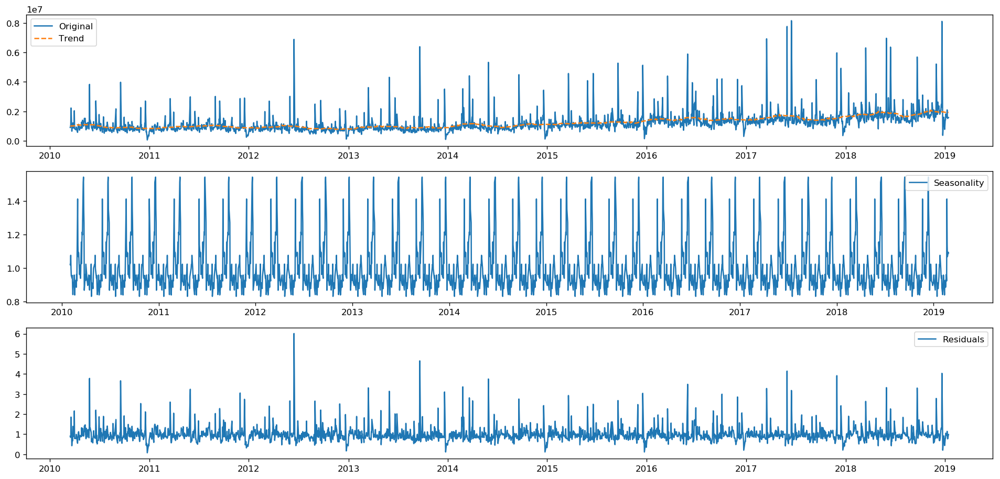

In [398]:
# we choose a multiplicative model because intuitively as daily volumes increase, close volumes would too and so would their fluctuations.
# we choose a frequency of 63 periods (quarterly) as it represent a good average of the events/special days we're trying to modelize.

close_volume_ts = df_avg.set_index('date')['close_volume']
decomposition = seasonal_decompose(close_volume_ts, model='multiplicative', freq=63)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.figure(figsize=(16,10))

plt.figure(1)
plt.subplot(411)
plt.plot(trend*seasonal*residual, label = 'Original')
plt.plot(trend, label = 'Trend',linestyle='--')
plt.legend(loc = 'best')
plt.subplot(412)
plt.plot(seasonal, label = 'Seasonality')
plt.legend(loc = 'best')
plt.subplot(413)
plt.plot(residual, label = 'Residuals')
plt.legend(loc = 'best')
plt.tight_layout()

We can see from this decomposition analysis that `close_volume` is made up of a slight general up trend, several seasonal components (roughly every quarter) and a non-systematic residual component.

##### 6.2.4.2 Partial Autocorrelation Function
Here we try to ascertain how much the data is correlated with itself.

In other words we're searching for 3 parameters:
1. `p`: number of lag observations
2. `d`: the degree of differencing
3. `q`: the size of the moving window

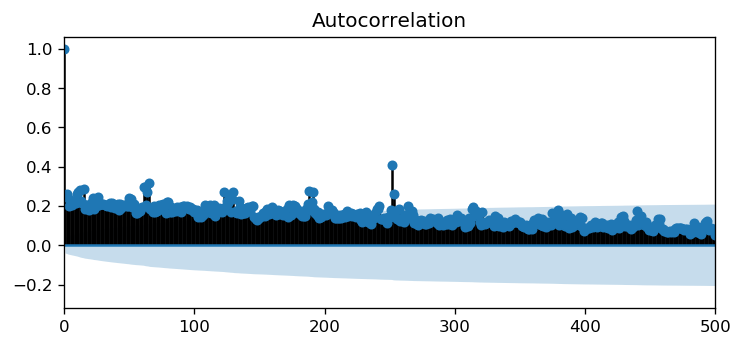

In [394]:
# searching for d by plotting the autocorellation function 
plot_acf(close_volume_ts)
plt.xlim(0,500)
plt.show()

`close_volume` is non-stationary, we need to apply first order differencing.

We will use a first order differencing (**d==1**) to make `close_volume` stationary.

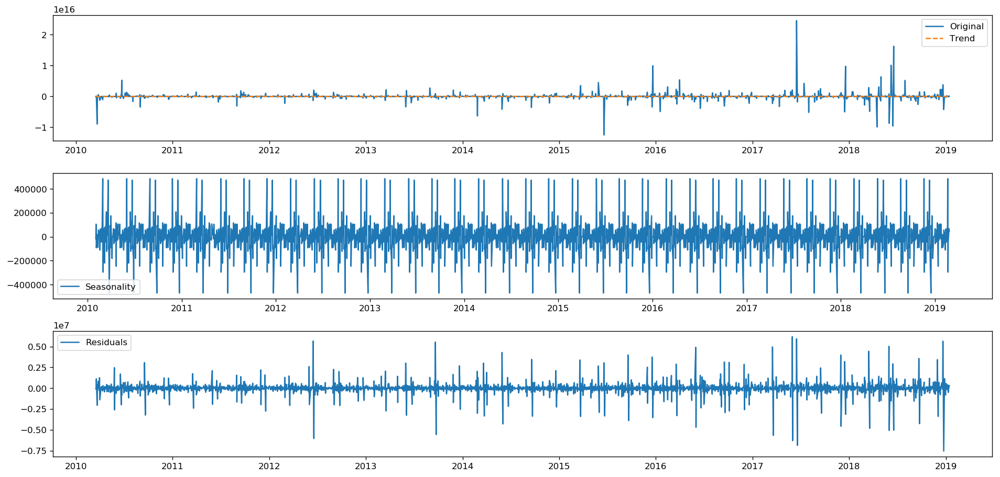

In [400]:
decomposition = seasonal_decompose(close_volume_ts.diff(1).dropna(), model='additive', freq=63)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.figure(figsize=(16,10))

plt.figure(1)
plt.subplot(411)
plt.plot(trend*seasonal*residual, label = 'Original')
plt.plot(trend, label = 'Trend',linestyle='--')
plt.legend(loc = 'best')
plt.subplot(412)
plt.plot(seasonal, label = 'Seasonality')
plt.legend(loc = 'best')
plt.subplot(413)
plt.plot(residual, label = 'Residuals')
plt.legend(loc = 'best')
plt.tight_layout()

The above plots, confirm that the time series reaches **stationarity** with **one order of differencing**.

Let's compare autocorrelation and partial co

In [77]:
def plot_autocorrelation(data, corr_lag=50):
    plt.rcParams.update({'figure.figsize':(16,7), 'figure.dpi':120})

    fig, axes = plt.subplots(3, 3, sharex=False)
    axes[0, 0].plot(data.values); axes[0, 0].set_title('Original Series')
    plot_acf(data, lags=corr_lag, ax=axes[0, 1])
    plot_pacf(data, lags=corr_lag, ax=axes[0, 2])

    # 1st Differencing
    axes[1, 0].plot(data.diff(1).dropna().values[:50]); axes[1, 0].set_title('1st Order Differencing')
    plot_acf(data.diff(1).dropna(), lags=corr_lag, ax=axes[1, 1])
    plot_pacf(data.diff(1).dropna(), lags=corr_lag, ax=axes[1, 2])

    # 2nd Differencing
    axes[2, 0].plot(data.diff(2).dropna().values[:50]); axes[2, 0].set_title('2nd Order Differencing')
    plot_acf(data.diff(2).dropna(), lags=corr_lag, ax=axes[2, 1])
    plot_pacf(data.diff(2).dropna(), lags=corr_lag, ax=axes[2, 2])

    plt.show()

In [78]:
def plot_normal_probability(data):
    plt.rcParams.update({'figure.figsize':(7, 3), 'figure.dpi':120})
    
    plt.subplot(121)
    data.hist(bins=50)
    
    plt.subplot(122)
    stats.probplot(data, plot=plt)

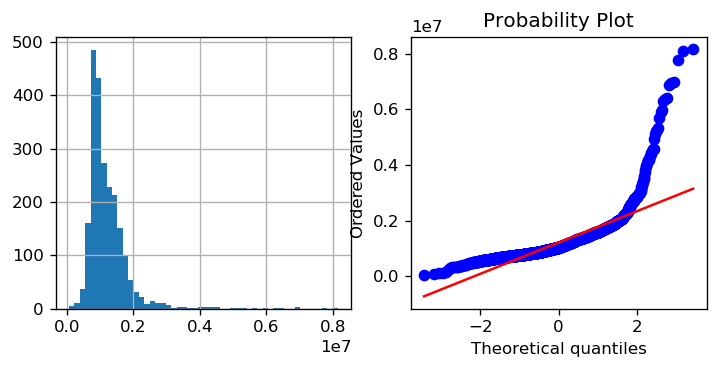

In [47]:
plot_normal_probability(close_volume_ts)

** Our data is clearly not normal **

Let's try to apply a log transform and a first order differencing to normalize it more and make it stationary at the same time.

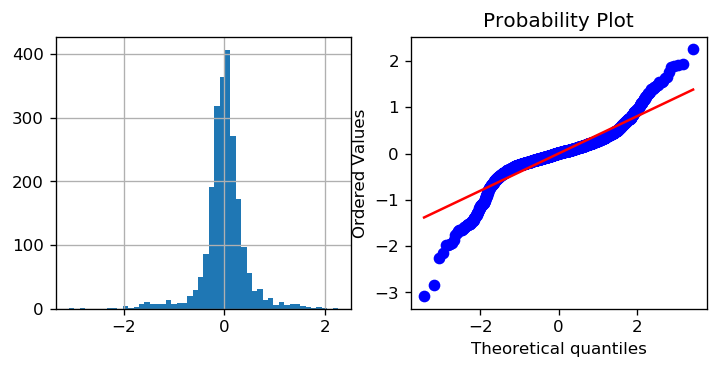

In [422]:
plot_normal_probability(np.log(close_volume_ts).diff(1).dropna())

**This is better but far from being a normal distribution!**

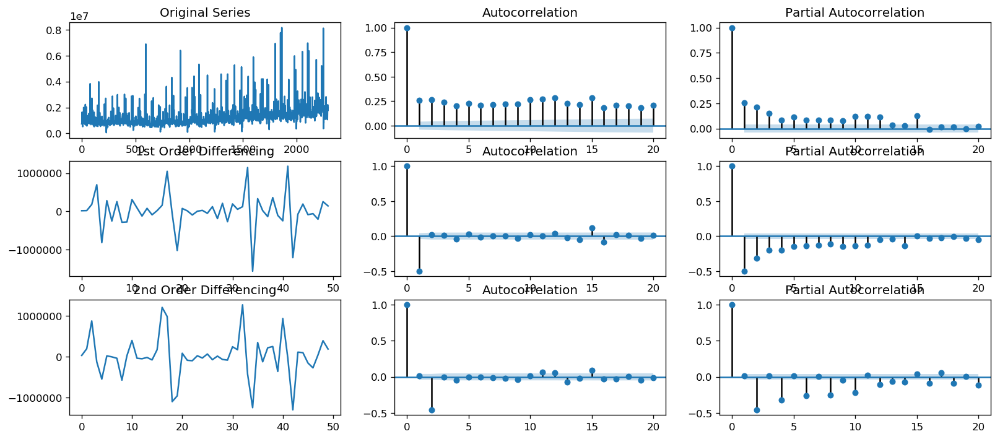

In [81]:
# let's plot the correlation of our time series observations, with observations from previous time steps (or lags).
# let's plot the same of the first and second order differencing times series as well.
plot_autocorrelation(close_volume_ts, corr_lag=20)

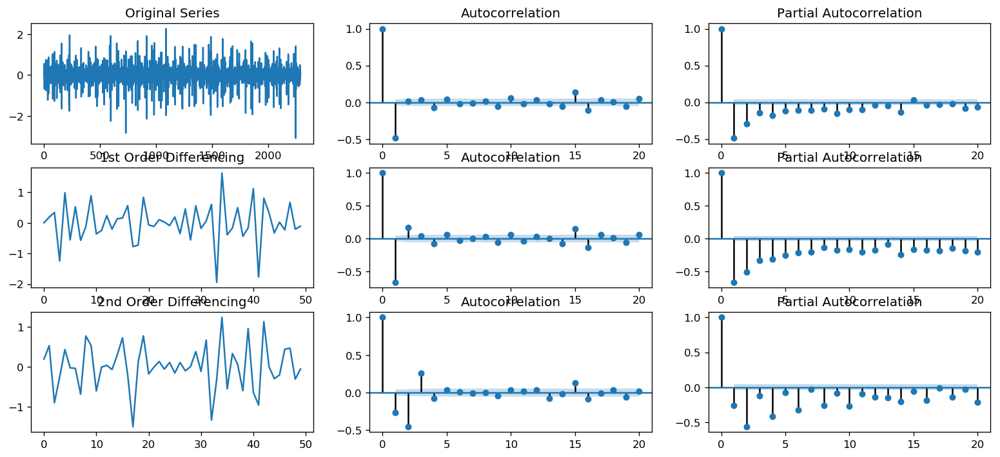

In [82]:
# let's plot the correlation of our log and 1-order differencing transformed time series observations, with observations from previous time steps (or lags).
# let's plot the same of the first and second order differencing times series as well.
plot_autocorrelation(np.log(close_volume_ts).diff(1).dropna(), corr_lag=20)

**From the above we can see that our transformed data is stationary.**

We could use Autocorrelation plots and Partial Autocorrelation plots to determine `q` and `p` but we will grid search it instead using the `Akaike Information Critera` (AIC).

##### 6.2.4.3 Building the model

In [436]:
# let's create a class to support the sklearn API (fit, predict) so we can integrate this model to aformentionned utility functions.
class Sarimax:
    def __init__(self, data, true_data=None, is_log_data=False, is_diff_data=False, data_diff_order=0, params=None):
        self.data = data
        self.true_data = true_data
        self.is_log_data = is_log_data
        self.is_diff_data = is_diff_data
        self.data_diff_order = data_diff_order
        self.train = None
        self.test = None
        self.params = params
        self.model = None
        self.order = None
        self.seasonal_order = None
        self.seasonal_periodicity = 1
        self.test_size = 0.3
        self.end_train_idx = None
        self.start_time = None
        self.end_time = None
        self.kpi = None
        self.df_preds = None
        
        self.set_params(self.params)
        self.split_train_test_data()

        
    def set_params(self, params):
        self.params = params
        
        if params is not None:
            if 'order' in self.params:
                self.order = params['order']
            if 'seasonal_order' in self.params:
                self.seasonal_order = params['seasonal_order']
            if 'seasonal_periodicity' in self.params:
                self.seasonal_periodicity = params['seasonal_periodicity']
            if 'test_size' in self.params:
                self.test_size = params['test_size'] 
    
    def grid_search_arima_params(self, data, seasonal_periodicity=1):
        Qs = range(0, 1)
        qs = range(0, 2)
        Ps = range(0, 2)
        ps = range(0, 2)
        D=1
        parameters = product(ps, qs, Ps, Qs)
        parameters_list = list(parameters)
        best_aic = float("inf")
        best_arima = None
        for param in parameters_list:
            try:
                arima = SARIMAX(data.values, order=(param[0], D, param[1]), seasonal_order=(param[2], D, param[3], seasonal_periodicity)).fit(disp=-1)
            except:
                continue
            aic = arima.aic
            if best_arima is None:
                best_arima = arima
            if aic < best_aic and aic:
                best_arima = arima
                best_aic = aic
        print('best_aic: {}'.format(best_aic))
        return best_arima, best_aic
    
    def split_train_test_data(self):
        # split data into train and test datasets
        self.end_train_idx = int(self.data.shape[0]*(1-self.test_size))
        self.train = self.data[:self.end_train_idx]
        self.test = self.data[self.end_train_idx:]
        print('train.shape: {}, test.shape: {}, end_train_idx: {}'.format(self.train.shape, self.test.shape, self.end_train_idx))
    
    def fit(self):
        self.start_time = time.time()
        
        if self.order is not None and self.seasonal_order is not None:
            best_order = self.order
            best_seasonal_order = self.seasonal_order
        else:
            # grid search the best order and seasonal order
            print('grid searching best order and seasonal order')
            best_arima, best_aic = self.grid_search_arima_params(self.train, seasonal_periodicity=self.seasonal_periodicity)
            best_order = best_arima.specification['order']
            best_seasonal_order = best_arima.specification['seasonal_order']
            
        print('best_order: {}'.format(best_order))
        print('best_seasonal_order: {}'.format(best_seasonal_order))
        
        # build and train the model 
        model = SARIMAX(self.train, order=best_order, seasonal_order=best_seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
        self.model = model.fit()
        
    def predict_evaluate(self):
        if self.model is None:
            return np.array()
        
        # create dataframe to keep train and test predictions
        measure = self.data.name
        self.df_preds = pd.DataFrame(self.data).rename(columns={self.data.name: 'true_{}'.format(self.data.name)})
        
        # make predictions
        y_train_preds = self.model.predict(0, self.end_train_idx - 1)
        y_test_preds = self.model.predict(self.end_train_idx, self.end_train_idx + len(self.test) - 1)
        self.df_preds[measure] = np.hstack([y_train_preds.ravel(), y_test_preds.ravel()])
        #print('df_preds: {}'.format(self.df_preds.head()))
        
        y_train = self.data[:self.end_train_idx]
        y_test = self.data[self.end_train_idx:]
        
        # if required inverse the log scalling of the predictions
        if self.is_log_data and not self.is_diff_data:
            y_train_preds = np.exp(y_train_preds)
            y_test_preds = np.exp(y_test_preds)
            
            self.df_preds.drop(columns=[measure], inplace=True)
            self.df_preds[measure] = np.hstack([y_train_preds.ravel(), y_test_preds.ravel()])
            
            y_train = np.exp(y_train)
            y_test = np.exp(y_test)
            
        # if required inverse the differencing of order self.data_diff_order to the predictions
        if self.is_diff_data and self.data_diff_order>0:
            if self.is_log_data:
                y_train_preds = np.exp(y_train_preds)
                y_test_preds = np.exp(y_test_preds)
            
            print('before mult, y_train_preds: {}, y_test_preds: {}'.format(y_train_preds.shape, y_test_preds.shape))
            print('mult true: {}'.format(self.true_data[:y_train_preds.shape[0]].shape))
            
            y_train_preds = y_train_preds * self.true_data[self.data_diff_order:y_train_preds.shape[0]+1]
            print('after mult, y_train_preds: {}'.format(y_train_preds.shape))
            y_test_preds = y_test_preds * self.true_data[self.data_diff_order+y_train_preds.shape[0]: self.data_diff_order+y_train_preds.shape[0]+y_test_preds.shape[0]].values
            
            self.df_preds.drop(columns=[measure], inplace=True)
            # we remove the first self.data_diff_order lines as by differencing we've reduced our samples by self.data_diff_order rows!
            #self.df_preds = self.df_preds[self.data_diff_order:]
            
            print('Sarimax.predict, df_preds.shape: {}, y_train_preds.shape: {}, y_test_preds.shape: {}, y_train.shape: {}, y_test.shape: {}'.format(self.df_preds.shape, y_train_preds.shape, y_test_preds.shape, y_train.shape, y_test.shape))
        
            self.df_preds[measure] = np.hstack([y_train_preds.ravel(), y_test_preds.ravel()])
            
            y_train = self.true_data[self.data_diff_order:self.end_train_idx + self.data_diff_order]
            y_test = self.true_data[self.end_train_idx + self.data_diff_order:]
            
        print('Sarimax.predict, df_preds.shape: {}, y_train_preds.shape: {}, y_test_preds.shape: {}, y_train.shape: {}, y_test.shape: {}'.format(self.df_preds.shape, y_train_preds.shape, y_test_preds.shape, y_train.shape, y_test.shape))
        
        # model evaluation using MSE and R2
        train_mse = mean_squared_error(y_train, y_train_preds)
        train_mae = mean_absolute_error(y_train, y_train_preds)
        train_r2 = r2_score(y_train, y_train_preds)
        test_mse = mean_squared_error(y_test, y_test_preds)
        test_mae = mean_absolute_error(y_test, y_test_preds)
        test_r2 = r2_score(y_test, y_test_preds)
        
        self.end_time = time.time()

        self.kpi = {'train_mse': train_mse,
                    'train_r2': train_r2,
                    'train_mae': train_mae,
                    'test_mse': test_mse, 
                    'test_r2': test_r2,
                    'test_mae': test_mae,
                    'train_acc': 0,
                    'train_std': 0,
                    'processing_time': self.end_time - self.start_time
                   }
        print('kpi: {}'.format(self.kpi))
        
        return self.kpi

In [226]:
def add_model(model_id, model, model_kpi, global_kpi, global_models):
    # add our model's kpi to global_kpi dataframe
    global_kpi.loc[model_id] = list(v for k,v in model_kpi.items())
    
    # add our model to global_models dictionary
    global_models[model_id] = [model, {}, {}]

###### SARIMAX baseline 

In [426]:
params = {'seasonal_periodicity': 21}
data = df_avg.set_index('date')['close_volume']
sarimax = Sarimax(data, params=params)
sarimax.fit()
sarimax.predict_evaluate()
add_model('Sarimax baseline', sarimax, sarimax.kpi, kpis, models)

train.shape: (1605,), test.shape: (688,), end_train_idx: 1605
grid searching best order and seasonal order
best_aic: 46999.21225295428
best_order: (1, 1, 1)
best_seasonal_order: (1, 1, 0, 21)
Sarimax.predict, df_preds.shape: (2293, 2), y_train_preds.shape: (1605,), y_test_preds.shape: (688,), y_train.shape: (1605,), y_test.shape: (688,)
kpi: {'train_mse': 418777189352.3453, 'train_r2': -0.4314952053095915, 'train_mae': 349405.3258201444, 'test_mse': 1177842526485.9663, 'test_r2': -0.8731794344348813, 'test_mae': 595518.8912182695, 'train_acc': 0, 'train_std': 0, 'processing_time': 26.336561918258667}


###### SARIMAX log 

In [411]:
params = {'seasonal_periodicity': 21}
data = df_avg.set_index('date')['close_volume']
log_data = np.log(data)
sarimax_log = Sarimax(log_data, true_data=data, is_log_data=True, params=params)
sarimax_log.fit()
sarimax_log.predict_evaluate()
add_model('Sarimax log', sarimax_log, sarimax_log.kpi, kpis, models)

train.shape: (1605,), test.shape: (688,), end_train_idx: 1605
grid searching best order and seasonal order
best_aic: 1772.092778769373
best_order: (1, 1, 1)
best_seasonal_order: (1, 1, 0, 21)
Sarimax.predict, df_preds.shape: (2293, 2), y_train_preds.shape: (1605,), y_test_preds.shape: (688,), y_train.shape: (1605,), y_test.shape: (688,)
kpi: {'train_mse': 384280945803364.5, 'train_r2': -1312.5775906517163, 'train_mae': 816719.4539091449, 'test_mse': 1002974593029.8761, 'test_r2': -0.5950785768700497, 'test_mae': 559780.3939538246, 'train_acc': 0, 'train_std': 0, 'processing_time': 27.874484062194824}


###### SARIMAX log + first order differencing 

In [424]:
params = {'seasonal_periodicity': 21}
data = df_avg.set_index('date')['close_volume']
log_data = np.log(data).diff(1).dropna()
sarimax_log_diff_1 = Sarimax(log_data, true_data=data, is_log_data=True, is_diff_data=True, data_diff_order=1, params=params)
sarimax_log_diff_1.fit()
sarimax_log_diff_1.predict_evaluate()
add_model('Sarimax log diff_1', sarimax_log_diff_1, sarimax_log_diff_1.kpi, kpis, models)

train.shape: (1604,), test.shape: (688,), end_train_idx: 1604
grid searching best order and seasonal order
best_aic: 2145.4555494422384
best_order: (1, 1, 1)
best_seasonal_order: (1, 1, 0, 21)
before mult, y_train_preds: (1604,), y_test_preds: (688,)
mult true: (1604,)
after mult, y_train_preds: (1604,)
Sarimax.predict, df_preds.shape: (2292, 1), y_train_preds.shape: (1604,), y_test_preds.shape: (688,), y_train.shape: (1604,), y_test.shape: (688,)
Sarimax.predict, df_preds.shape: (2292, 2), y_train_preds.shape: (1604,), y_test_preds.shape: (688,), y_train.shape: (1604,), y_test.shape: (688,)
kpi: {'train_mse': 186440396788.31787, 'train_r2': 0.36297754632539636, 'train_mae': 260528.15916622608, 'test_mse': 1234830350812.811, 'test_r2': -0.9638099033997876, 'test_mae': 472035.50937665196, 'train_acc': 0, 'train_std': 0, 'processing_time': 26.3894522190094}


**Let's plot close_volume predictions of these 3 SARIMAX models and compare them to our top 5 models discovered so far:**

In [427]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_mae', ascending=True).index[:5])
top_5_model_names += ['Sarimax baseline', 'Sarimax log', 'Sarimax log diff_1']
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

In [432]:
kpis.sort_values(['test_mae'])

,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
PassiveAggressiveRegressor GS,101912043010.375,0.743,183712.856,238775686126.210,0.658,290684.651,0.650,0.145,5.620
SGDRegressor GS,100109892800.143,0.747,193479.764,241009456378.506,0.654,296704.671,0.655,0.082,1.207
LinearRegression,93797485809.232,0.763,187271.555,228746446600.001,0.672,298278.477,0.687,0.087,0.039
Lasso,93797861209.581,0.763,187242.842,228971053100.379,0.672,298658.315,0.688,0.087,0.133
Lasso GS,93799220748.930,0.763,187200.784,229551125232.496,0.671,299389.593,0.688,0.087,0.788
Ridge,93836671622.824,0.763,186992.650,232759901138.431,0.666,303068.547,0.693,0.086,0.026
HuberRegressor,101836236729.944,0.743,183389.373,261404518601.095,0.625,304366.193,0.686,0.084,0.185
HuberRegressor GS,95567706784.305,0.759,183185.555,242203333435.566,0.653,304407.636,0.698,0.087,6.152
BayesianRidge,94308356078.282,0.762,186805.920,245240493017.332,0.648,314084.967,0.698,0.082,0.035
BayesianRidge GS,94308356620.162,0.762,186805.920,245240502248.318,0.648,314084.974,0.698,0.082,9.437


**We can conclude that SARIMAX doesn't fair well with this dataset compared to other regressors.**

**Sarimax log diff_1** does perform a bit better than its baseline and log peers but not by much.

###### Residual plots of our best SARIMAX model

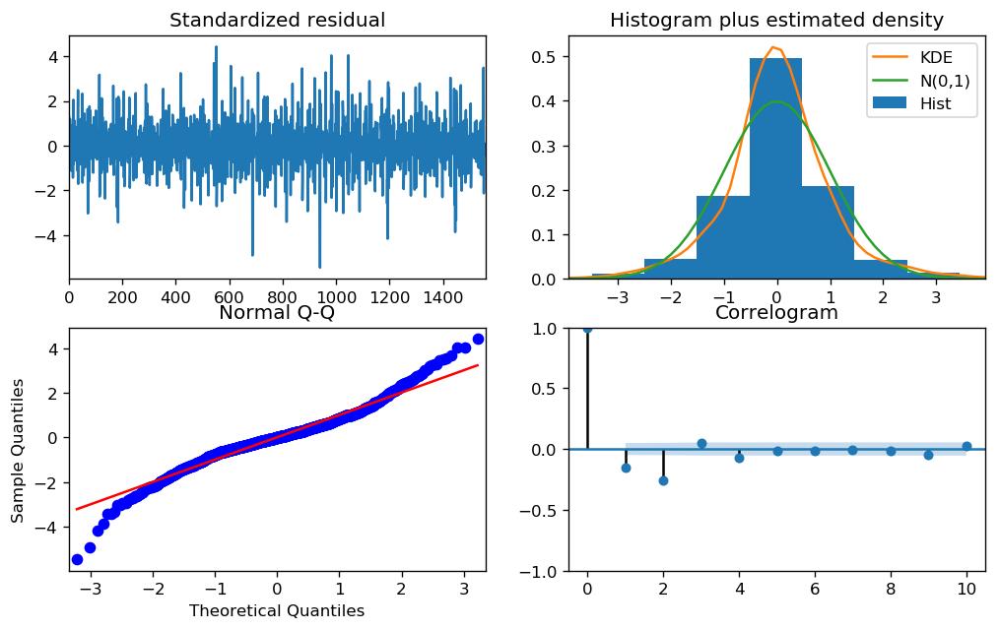

In [435]:
models['Sarimax log diff_1'][0].model.plot_diagnostics(figsize=(10, 6))
plt.show()

**Interpretation of the plot diagnostics:**

`Standardized residuals`: The residual errors seem to fluctuate around a mean of zero and have a uniform variance.

`Histogram plus estimates density`: It suggests that the standardized residulas don't quite follow a normal distribution with mean zero (but still does it better than the other 2 SARIMAX models thanks to the log and the first order differencing applied to our data in this model.

`Normal Q-Q`: It shows clearly that our residuals distribution is skewed.

`Correlogram`: It shows that the residual errors are somewhat autocorrelated. Which implies that there is some pattern in the residual errors which are not explained in the model. So we should look for more predictors to the model (using the exogenous variables (not covered in this project).

### 6.3. Predicting `close_pct` 

#### 6.3.1. Experiment 1

In [83]:
# establishing a baseline model
models = models_init()
test_size = 0.3
target_col_name = 'close_pct'
features = ['special_day', 'weekday', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']
features_shifts = [0, 0, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.2469144734765466
Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.01, warm_start=False)
{'alpha': 0.01, 'tol': 0.01}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.24865792369656578
ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.1, 'l1_ratio': 0}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits
0.24391135668358194
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}
Start processing: BayesianRidge GS of class BayesianRidge with params {}
Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for each 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 376 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 3376 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    6.5s finished


0.2468980438236433
BayesianRidge(alpha_1=1e-06, alpha_2=0.0001, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=0.0001, lambda_2=1e-06, n_iter=300,
       normalize=False, tol=0.1, verbose=False)
{'alpha_1': 1e-06, 'alpha_2': 0.0001, 'lambda_1': 0.0001, 'lambda_2': 1e-06, 'n_iter': 300, 'tol': 0.1}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.23156224831306096
PassiveAggressiveRegressor(C=0.1, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=1500, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.0001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 0.1, 'max_iter': 1500, 'tol': 0.0001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:    3.3s finished


0.24822039798284876
HuberRegressor(alpha=1e-05, epsilon=1, fit_intercept=True, max_iter=100,
        tol=1e-05, warm_start=False)
{'alpha': 1e-05, 'epsilon': 1, 'max_iter': 100, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.3297127706517623
DecisionTreeRegressor(criterion='mse', max_depth=5, max_features='auto',
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=8, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mse', 'max_depth': 5, 'max_features': 'auto', 'min_samples_split': 8}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS
Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 1420 tasks      | elapsed:   32.1s
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:   41.3s finished


0.3222467793056833
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=15, p=2,
          weights='uniform')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 15, 'p': 2, 'weights': 'uniform'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.1s finished


-15.368083595260485
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [84]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_pct', 'special_day', 'weekday', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
PassiveAggressiveRegressor GS,17.063,0.424,2.934,37.354,0.142,4.803,0.276,0.215,0.478
HuberRegressor GS,14.605,0.507,2.775,44.005,-0.011,5.348,0.248,0.213,3.609
HuberRegressor,14.493,0.511,2.778,45.097,-0.036,5.424,0.244,0.232,0.064
SGDRegressor GS,14.652,0.505,2.796,48.997,-0.125,5.650,0.212,0.216,0.839
LinearRegression,14.318,0.517,2.796,49.204,-0.130,5.674,0.244,0.283,0.028
Lars,14.318,0.517,2.796,49.204,-0.130,5.674,0.244,0.283,0.048
Lars GS,14.318,0.517,2.796,49.204,-0.130,5.674,0.244,0.283,0.096
Ridge,14.318,0.517,2.796,49.220,-0.130,5.675,0.245,0.284,0.030
SGDRegressor,14.490,0.511,2.805,49.300,-0.132,5.676,0.241,0.287,0.023
BayesianRidge,14.320,0.516,2.797,49.358,-0.134,5.683,0.247,0.286,0.028


In [85]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

#### 6.3.2. Experiment 2

In [86]:
# using more available features to improve our baseline model
models = models_init()
test_size = 0.3
target_col_name = 'close_pct'
features = ['special_day', 'weekday', 'daily_volume', 'daily_volume_mean_20d', 'close_volume_mean_20d', 'close_pct_mean_20d', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']
features_shifts = [0, 0, 1, 1, 1, 1, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization, show_log_=False)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.49531080270433725
Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.01, warm_start=False)
{'alpha': 0.01, 'tol': 0.01}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


0.4948550274304389
ElasticNet(alpha=0.01, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.01, 'l1_ratio': 0.5}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits
0.4933149038864131
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}
Start processing: BayesianRidge GS of class BayesianRidge with params {}
Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 3712 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    7.3s finished


0.495623893030515
BayesianRidge(alpha_1=0.0001, alpha_2=1e-06, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=1e-06, lambda_2=0.0001, n_iter=300,
       normalize=False, tol=0.001, verbose=False)
{'alpha_1': 0.0001, 'alpha_2': 1e-06, 'lambda_1': 1e-06, 'lambda_2': 0.0001, 'n_iter': 300, 'tol': 0.001}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.4938475341108868
PassiveAggressiveRegressor(C=0.1, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=1000, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.0001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 0.1, 'max_iter': 1000, 'tol': 0.0001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.49599834454481556
HuberRegressor(alpha=0.01, epsilon=2.5, fit_intercept=True, max_iter=100,
        tol=1e-05, warm_start=False)
{'alpha': 0.01, 'epsilon': 2.5, 'max_iter': 100, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    6.5s finished


0.3090049497420673
DecisionTreeRegressor(criterion='mae', max_depth=5, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=16, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mae', 'max_depth': 5, 'max_features': None, 'min_samples_split': 16}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS
Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 744 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1094 tasks      | elapsed:   47.8s
[Parallel(n_jobs=-1)]: Done 1544 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.3min finished


0.40457322311239297
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=15, p=1,
          weights='distance')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 15, 'p': 1, 'weights': 'distance'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  45 | elapsed:    0.9s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.2s finished


-38.39184316881867
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [87]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_pct', 'special_day', 'weekday', 'daily_volume_p1', 'daily_volume_mean_20d_p1', 'close_volume_mean_20d_p1', 'close_pct_mean_20d_p1', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
SGDRegressor GS,10.666,0.640,2.353,17.412,0.600,3.179,0.477,0.098,1.051
LinearRegression,10.263,0.653,2.292,18.662,0.571,3.223,0.493,0.076,0.022
Lars,10.263,0.653,2.292,18.662,0.571,3.223,0.493,0.076,0.039
Lars GS,10.263,0.653,2.292,18.662,0.571,3.223,0.493,0.076,0.089
Ridge,10.263,0.653,2.293,18.665,0.571,3.222,0.496,0.074,0.038
BayesianRidge GS,10.269,0.653,2.294,18.709,0.570,3.222,0.496,0.073,7.484
BayesianRidge,10.269,0.653,2.294,18.709,0.570,3.222,0.496,0.073,0.024
Ridge GS,10.272,0.653,2.294,18.732,0.570,3.222,0.495,0.074,0.220
ElasticNet GS,10.273,0.653,2.294,18.767,0.569,3.225,0.495,0.074,0.365
Lasso GS,10.273,0.653,2.295,18.775,0.569,3.228,0.495,0.074,0.251


So again **adding features** pertaining to daily volume, daily volume rolling mean, close volume rolling mean and close pct rolling mean **significantly improved** our results.

In [88]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

#### 6.3.3. Experiment 3

Let's try to improve on the previous experiment by adding even more features to our dataset.

We will be using the same derived features than in section 6.2.3 when we were predicting `close_volume`.

In [89]:
# from df_avg let's create our advanced dataframe
df_avg_adv =  create_advanced_df(df_avg)
df_avg_adv.head()

,date,special_day,daily_volume,close_volume,close_pct,daily_volume_mean_20d,close_volume_mean_20d,close_pct_mean_20d,date_type_monthly_last_business_day,date_type_msci_quarterly_review,date_type_msci_semi_annual_review,date_type_quarterly_expiry,weekday,day,week,month,year,log_daily_volume,log_close_volume,log_close_pct,log_daily_volume_mean_20d,log_close_volume_mean_20d,log_close_pct_mean_20d,daily_volume_sd_rmean5_p1,close_volume_sd_rmean5_p1,close_pct_sd_rmean5_p1,daily_volume_sd_rmean2_p1,close_volume_sd_rmean2_p1,close_pct_sd_rmean2_p1,daily_volume_sd_lbd_rmean5_p1,close_volume_sd_lbd_rmean5_p1,close_pct_sd_lbd_rmean5_p1,daily_volume_sd_qr_rmean5_p1,close_volume_sd_qr_rmean5_p1,close_pct_sd_qr_rmean5_p1,daily_volume_sd_sar_rmean5_p1,close_volume_sd_sar_rmean5_p1,close_pct_sd_sar_rmean5_p1,daily_volume_sd_qe_rmean5_p1,close_volume_sd_qe_rmean5_p1,close_pct_sd_qe_rmean5_p1,daily_volume_sd_p1,close_volume_sd_p1,close_pct_sd_p1,daily_volume_sd_p2,close_volume_sd_p2,close_pct_sd_p2,daily_volume_sd_p3,close_volume_sd_p3,close_pct_sd_p3
716,2012-11-30,1,5818702.996,2184342.507,37.540,4943970.822,843106.900,17.053,1.000,0.000,1.000,0.000,4,30,48,11,2012,15.577,14.597,3.625,15.414,13.645,2.836,6141695.786,1792764.130,28.970,5545671.111,1199062.218,21.956,5837548.406,1546541.999,26.922,8389635.647,2160576.846,26.541,9555609.358,2991577.977,31.947,11066276.373,3438198.705,29.702,6134594.940,1153827.389,18.809,4956747.282,1244297.047,25.103,9030751.416,2743718.953,30.382
717,2012-12-03,0,3911035.484,672660.340,17.199,5043485.686,848190.029,16.818,0.000,0.000,0.000,0.000,0,3,49,12,2012,15.179,13.419,2.845,15.434,13.651,2.822,6141695.786,1792764.130,28.970,5545671.111,1199062.218,21.956,5837548.406,1546541.999,26.922,8389635.647,2160576.846,26.541,9555609.358,2991577.977,31.947,11066276.373,3438198.705,29.702,6134594.940,1153827.389,18.809,4956747.282,1244297.047,25.103,9030751.416,2743718.953,30.382
718,2012-12-04,0,3825368.665,711887.187,18.610,4831064.429,848074.822,17.555,0.000,0.000,0.000,0.000,1,4,49,12,2012,15.157,13.476,2.924,15.391,13.651,2.865,6141695.786,1792764.130,28.970,5545671.111,1199062.218,21.956,5837548.406,1546541.999,26.922,8389635.647,2160576.846,26.541,9555609.358,2991577.977,31.947,11066276.373,3438198.705,29.702,6134594.940,1153827.389,18.809,4956747.282,1244297.047,25.103,9030751.416,2743718.953,30.382
719,2012-12-05,0,4729380.565,933463.100,19.738,4783174.155,849898.269,17.768,0.000,0.000,0.000,0.000,2,5,49,12,2012,15.369,13.747,2.983,15.381,13.653,2.877,6141695.786,1792764.130,28.970,5545671.111,1199062.218,21.956,5837548.406,1546541.999,26.922,8389635.647,2160576.846,26.541,9555609.358,2991577.977,31.947,11066276.373,3438198.705,29.702,6134594.940,1153827.389,18.809,4956747.282,1244297.047,25.103,9030751.416,2743718.953,30.382
720,2012-12-06,0,4638219.207,801024.920,17.270,4831593.415,853510.518,17.665,0.000,0.000,0.000,0.000,3,6,49,12,2012,15.350,13.594,2.849,15.391,13.657,2.872,6141695.786,1792764.130,28.970,5545671.111,1199062.218,21.956,5837548.406,1546541.999,26.922,8389635.647,2160576.846,26.541,9555609.358,2991577.977,31.947,11066276.373,3438198.705,29.702,6134594.940,1153827.389,18.809,4956747.282,1244297.047,25.103,9030751.416,2743718.953,30.382


In [90]:
# using more available features to improve our baseline model
models = models_init()
test_size = 0.3
target_col_name = 'close_pct'
features = ['special_day', 'weekday', 'day', 'week', 'month', 'daily_volume', 'daily_volume_mean_20d', 'close_volume_mean_20d', 'close_pct_mean_20d', 'date_type_monthly_last_business_day',
            'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry', 
            'daily_volume_sd_rmean5_p1', 'close_volume_sd_rmean5_p1', 'close_pct_sd_rmean5_p1', 'daily_volume_sd_p1', 'close_volume_sd_p1', 
            'close_pct_sd_p1', 'daily_volume_sd_p2', 'close_volume_sd_p2', 'close_pct_sd_p2', 'daily_volume_sd_p3', 'close_volume_sd_p3', 'close_pct_sd_p3', 
            'close_volume_sd_lbd_rmean5_p1', 'close_volume_sd_qr_rmean5_p1', 'close_volume_sd_sar_rmean5_p1', 'close_volume_sd_qe_rmean5_p1'
           ]
features_shifts = [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
with_normalization = True
kpis, dataset = run_pipeline(df_avg_adv, models, test_size, features, features_shifts, target_col_name, with_normalization_=with_normalization, show_log_=False)

Start processing: LinearRegression of class LinearRegression with params {}
Start processing: Ridge of class Ridge with params {}
Start processing: Ridge GS of class Ridge with params {}
Start processing: Lasso of class Lasso with params {}
Start processing: Lasso GS of class Lasso with params {}
Running GridSearchCV for model: Lasso GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


0.5850250777608682
Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.01, 'tol': 0.0001}
Start processing: ElasticNet of class ElasticNet with params {}
Start processing: ElasticNet GS of class ElasticNet with params {}
Running GridSearchCV for model: ElasticNet GS
Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:    0.4s finished


0.5868501427971241
ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)
{'alpha': 0.1, 'l1_ratio': 0}
Start processing: Lars of class Lars with params {}
Start processing: Lars GS of class Lars with params {}
Running GridSearchCV for model: Lars GS
Fitting 5 folds for each of 2 candidates, totalling 10 fits
-106.09259398920845
Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
   fit_path=True, n_nonzero_coefs=500, normalize=True, positive=False,
   precompute='auto', verbose=False)
{'n_nonzero_coefs': 500}
Start processing: OrthogonalMatchingPursuit of class OrthogonalMatchingPursuit with params {}
Start processing: BayesianRidge of class BayesianRidge with params {}
Start processing: BayesianRidge GS of class BayesianRidge with params {}

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished



Running GridSearchCV for model: BayesianRidge GS
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2032 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 4860 out of 4860 | elapsed:    9.2s finished


0.584192621535897
BayesianRidge(alpha_1=1e-06, alpha_2=0.0001, compute_score=False, copy_X=True,
       fit_intercept=True, lambda_1=0.0001, lambda_2=1e-06, n_iter=300,
       normalize=False, tol=0.1, verbose=False)
{'alpha_1': 1e-06, 'alpha_2': 0.0001, 'lambda_1': 0.0001, 'lambda_2': 1e-06, 'n_iter': 300, 'tol': 0.1}
Start processing: SGDRegressor of class SGDRegressor with params {}
Start processing: SGDRegressor GS of class SGDRegressor with params {'alpha': 0.0001, 'l1_ratio': 1, 'learning_rate': 'optimal', 'loss': 'squared_loss', 'max_iter': 2000, 'penalty': 'none'}
Start processing: PassiveAggressiveRegressor of class PassiveAggressiveRegressor with params {}
Start processing: PassiveAggressiveRegressor GS of class PassiveAggressiveRegressor with params {}
Running GridSearchCV for model: PassiveAggressiveRegressor GS
Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    0.5s finished


0.500614554408933
PassiveAggressiveRegressor(C=0.1, average=False, early_stopping=False,
              epsilon=0.1, fit_intercept=True, loss='epsilon_insensitive',
              max_iter=2000, n_iter=None, n_iter_no_change=5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
{'C': 0.1, 'max_iter': 2000, 'tol': 0.001}
Start processing: HuberRegressor of class HuberRegressor with params {}
Start processing: HuberRegressor GS of class HuberRegressor with params {}
Running GridSearchCV for model: HuberRegressor GS
Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:   11.3s finished


0.5738688937195191
HuberRegressor(alpha=0.01, epsilon=1.35, fit_intercept=True, max_iter=300,
        tol=1e-05, warm_start=False)
{'alpha': 0.01, 'epsilon': 1.35, 'max_iter': 300, 'tol': 1e-05}
Start processing: DecisionTreeRegressor of class DecisionTreeRegressor with params {}
Start processing: DecisionTreeRegressor GS of class DecisionTreeRegressor with params {}
Running GridSearchCV for model: DecisionTreeRegressor GS
Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:    6.6s finished


0.44511231596808015
DecisionTreeRegressor(criterion='mse', max_depth=5, max_features='log2',
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=8, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
{'criterion': 'mse', 'max_depth': 5, 'max_features': 'log2', 'min_samples_split': 8}
Start processing: KNeighborsRegressor of class KNeighborsRegressor with params {}
Start processing: KNeighborsRegressor GS of class KNeighborsRegressor with params {}
Running GridSearchCV for model: KNeighborsRegressor GS


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 311 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 561 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 911 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 1361 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.8min finished


Fitting 5 folds for each of 360 candidates, totalling 1800 fits
0.515243029318729
KNeighborsRegressor(algorithm='auto', leaf_size=10, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=15, p=2,
          weights='distance')
{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 15, 'p': 2, 'weights': 'distance'}
Start processing: SVR of class SVR with params {'gamma': 'scale'}
Start processing: KernelRidge of class KernelRidge with params {}
Start processing: KernelRidge GS of class KernelRidge with params {}
Running GridSearchCV for model: KernelRidge GS
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    0.7s finished


-100.60765799538275
KernelRidge(alpha=10, coef0=1, degree=2, gamma=None, kernel='linear',
      kernel_params=None)
{'alpha': 10, 'degree': 2, 'kernel': 'linear'}
Start processing: LightGBM_Regressor of class LightGBM_Regressor with params {'boosting_type': 'gbdt', 'objective': 'regression', 'metric': {'rmse'}, 'learning_rate': 0.5, 'num_leaves': 150, 'verbose': 0}


In [92]:
show_pipeline_results(dataset['features'], kpis)

features_final: ['prev_close_pct', 'special_day', 'weekday', 'day', 'week', 'month', 'daily_volume_p1', 'daily_volume_mean_20d_p1', 'close_volume_mean_20d_p1', 'close_pct_mean_20d_p1', 'date_type_monthly_last_business_day', 'date_type_msci_quarterly_review', 'date_type_msci_semi_annual_review', 'date_type_quarterly_expiry', 'daily_volume_sd_rmean5_p1', 'close_volume_sd_rmean5_p1', 'close_pct_sd_rmean5_p1', 'daily_volume_sd_p1', 'close_volume_sd_p1', 'close_pct_sd_p1', 'daily_volume_sd_p2', 'close_volume_sd_p2', 'close_pct_sd_p2', 'daily_volume_sd_p3', 'close_volume_sd_p3', 'close_pct_sd_p3', 'close_volume_sd_lbd_rmean5_p1', 'close_volume_sd_qr_rmean5_p1', 'close_volume_sd_sar_rmean5_p1', 'close_volume_sd_qe_rmean5_p1']


,train_mse,train_r2,train_mae,test_mse,test_r2,test_mae,train_acc,train_std,processing_time
LinearRegression,10.219,0.651,2.225,12.228,0.692,2.614,0.564,0.094,0.029
Ridge,10.220,0.651,2.225,12.393,0.688,2.617,0.572,0.088,0.033
HuberRegressor,10.363,0.647,2.208,12.573,0.683,2.651,0.573,0.074,0.279
HuberRegressor GS,10.363,0.647,2.208,12.583,0.683,2.652,0.574,0.073,11.939
SGDRegressor GS,11.132,0.620,2.332,13.963,0.648,2.904,-2315431.785,3082244.560,1.246
Ridge GS,10.255,0.650,2.227,14.366,0.638,2.837,0.583,0.076,0.328
BayesianRidge,10.276,0.649,2.229,15.171,0.618,2.934,0.584,0.075,0.031
BayesianRidge GS,10.277,0.649,2.229,15.172,0.618,2.934,0.584,0.075,9.432
Lasso GS,10.266,0.650,2.226,15.415,0.612,2.972,0.585,0.076,2.792
ElasticNet GS,10.421,0.645,2.245,19.575,0.507,3.415,0.587,0.070,0.633


In [93]:
# let's plot in & out of sample predictions for the top 5 models
# note: we will zoom on the first 40 out-sample predictions, you can pan right or left to visualize more out-sample predictions or in-sample ones.
# note: special day will be marked with a black circle.
# note: the separation between in & out of sample data is marked with a vertical black line.
top_5_model_names = list(kpis.sort_values('test_r2', ascending=False).index[:5])
test_start_date = dataset['x'].index[dataset['x_train'].shape[0]]
init_end_date = dataset['x'].index[dataset['x_train'].shape[0]+40]
x_range_init = (pd.to_datetime(test_start_date), pd.to_datetime(init_end_date))
chart_predictions(dataset['x'], dataset['y'], dataset['x_train'], dataset['y_train'], dataset['x_test'], dataset['y_test'], models, top_5_model_names, x_range_init=x_range_init)

**Adding derived features did improve our out of sample results.**

## 7. Conclusions

* `Data question`:

First let's anwer our initial data question `Can we predict future close volumes from historical volumes and other factors?`

**Yes** we managed to predict close volumes and close volumes percentages with a fairly low error from historical volumes, special events and features derived from these 2 core feature classes!

* `Best model`:

In both prediction exercises (close volumes and close volumes percentages) the same model came out on top: **Linear Regression**. 

For our most advanced experiment (with the derived features added) it reached out of sample r^2 above 0.68 which is a significant improvement compared to the bases models.

* `ARIMA`:

Despite several attemps at making ARIMA based models perform better I was unsuccessful in bringing one towards the top of the model ranking table.

Looking at the Mean Absolute Error, the best ARIMA model was still a good 30% worse than the best performing model.

* `What I learnt`:

**Data preparation** took a much much longer time than I would have ever anticipated. We do read and hear about this quite often but I've definitely experienced it first hand in this small project!

**Code factorization** was a great time saver in allowing me to scale up the number of experiments I was able to carry out in the limited time I had to complete this project. So definitely a practice I will keep using in other projects.

* `Going further`:

I would have loved to have time to do 2 things:
* Add new features to complement the ones already in use, e.g. **new market events**, **US indices volumes** (as US equity markets regime changes tend to lead european ones).
* Use **ensembling methods** like `Averaging`, `Boosting` and `Stacking` which essentially use several models to produce a better prediction than any of the individual models alone. 
